<a href="https://colab.research.google.com/github/anjali88/HFT-ML/blob/master/ALL__AIHFT_L2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install mxnet

     |████████████████████████████████| 55.0MB 73kB/s 
  Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1


In [2]:
pip install utils

In [3]:
pip install tensorflow==1.14

     |████████████████████████████████| 109.2MB 88kB/s 
     |████████████████████████████████| 491kB 45.0MB/s 
     |████████████████████████████████| 51kB 6.8MB/s 
     |████████████████████████████████| 3.2MB 45.9MB/s 
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tensorflow-estimator-2.3.0
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow 2.3.0
    Uninstalling tensorflow-2.3.0:
      Successfully uninstalled tensorflow-2.3.0


In [4]:
import tensorflow as tf

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

In [5]:
print(tf.__version__)

1.14.0


In [6]:
import pandas as pd
import numpy as np
import mxnet as mx
import time
import datetime
from pandas import DataFrame
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import math
from pylab import rcParams
from tqdm import tqdm_notebook

#Normalising imports
from sklearn.preprocessing import StandardScaler

# Modelling imports
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARIMA
import xgboost as xgb
from xgboost import XGBRegressor

#Performance metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import warnings
warnings.filterwarnings("ignore")

#Setting up mxnet model Need this to create an ARIMA model and Fourier series model easily
context = mx.cpu(); model_ctx=mx.cpu()
mx.random.seed(1719)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


##DATA ACQUISITION



In [7]:
from google.colab import files
uploaded1 = files.upload()
uploaded2 =files.upload()
uploaded3 = files.upload()
uploaded4 = files.upload()
uploaded5 = files.upload()
uploaded6 = files.upload()
uploaded7 = files.upload()
uploaded8 = files.upload()
uploaded9 = files.upload()
uploaded10 = files.upload()

Saving RDSB.xlsx to RDSB.xlsx


Saving ULVR.xlsx to ULVR.xlsx


Saving HSBC.xlsx to HSBC.xlsx


Saving BP.xlsx to BP.xlsx


Saving GSK.xlsx to GSK.xlsx


Saving LLOY.xlsx to LLOY.xlsx


Saving AZN.xlsx to AZN.xlsx


Saving TSCO.xlsx to TSCO.xlsx


Saving AAL.xlsx to AAL.xlsx


Saving DGE.xlsx to DGE.xlsx


##Data Visualisation

In [8]:
import io
dataset_ex_df_RDSB = pd.read_excel(io.BytesIO(uploaded1['RDSB.xlsx']))
print('RDSB Dataset')
print(dataset_ex_df_RDSB.head())

dataset_ex_df_ULVR = pd.read_excel(io.BytesIO(uploaded2['ULVR.xlsx']))
print('\n ULVR Dataset')
print(dataset_ex_df_ULVR.head())

dataset_ex_df_HSBC = pd.read_excel(io.BytesIO(uploaded3['HSBC.xlsx']))
print('\n HSBC Dataset')
print(dataset_ex_df_HSBC.head())

dataset_ex_df_BP = pd.read_excel(io.BytesIO(uploaded4['BP.xlsx']))
print('\n BP Dataset')
print(dataset_ex_df_BP.head())

dataset_ex_df_GSK = pd.read_excel(io.BytesIO(uploaded5['GSK.xlsx']))
print('\n GSK Dataset')
print(dataset_ex_df_GSK.head())

dataset_ex_df_LLOY = pd.read_excel(io.BytesIO(uploaded6['LLOY.xlsx']))
print('\n LLOY Dataset')
print(dataset_ex_df_LLOY.head())

dataset_ex_df_AZN = pd.read_excel(io.BytesIO(uploaded7['AZN.xlsx']))
print('\n AZN Dataset')
print(dataset_ex_df_AZN.head())

dataset_ex_df_TSCO = pd.read_excel(io.BytesIO(uploaded8['TSCO.xlsx']))
print('\n TSCO Dataset')
print(dataset_ex_df_TSCO.head())

RDSB Dataset
                Dates    Open   Close    High     Low       Value  Volume
0 2018-02-14 08:00:00  2319.0  2315.5  2319.0  2315.5  64152800.0   27677
1 2018-02-14 08:01:00  2316.5  2314.0  2316.5  2312.5  39831632.0   17206
2 2018-02-14 08:02:00  2311.5  2306.0  2312.0  2305.0  38951624.0   16871
3 2018-02-14 08:03:00  2306.5  2306.5  2309.5  2305.0  33872616.0   14683
4 2018-02-14 08:04:00  2309.0  2309.0  2309.0  2308.5   6997242.0    3031

 ULVR Dataset
                Dates    Open   Close    High     Low       Value  Volume
0 2018-02-14 08:00:00  3805.0  3797.5  3806.0  3797.5  37356124.0    9819
1 2018-02-14 08:01:00  3801.0  3800.0  3801.0  3800.0   2485724.0     654
2 2018-02-14 08:02:00  3797.0  3793.0  3797.0  3793.0   2189957.0     577
3 2018-02-14 08:03:00  3796.0  3802.5  3802.5  3795.0   6434300.5    1694
4 2018-02-14 08:04:00  3801.0  3799.5  3803.0  3796.5   8324898.0    2191

 HSBC Dataset
                Dates   Open  Close   High    Low         Value   Vol

In [9]:
dataset_ex_df_AAL = pd.read_excel(io.BytesIO(uploaded9['AAL.xlsx']))
print('\n AAL Dataset')
dataset_ex_df_AAL.head()


 AAL Dataset


,Dates,Open,Close,High,Low,Value,Volume
0,2018-02-14 08:00:00,1682.0,1679.8,1682.0,1677.6,36935376.0,21978
1,2018-02-14 08:01:00,1679.8,1680.8,1681.6,1678.0,28434078.0,16930
2,2018-02-14 08:02:00,1681.2,1679.0,1681.2,1678.0,24295556.0,14466
3,2018-02-14 08:03:00,1679.0,1675.6,1679.8,1675.4,19602172.0,11683
4,2018-02-14 08:04:00,1674.6,1676.4,1677.4,1674.6,10772108.0,6427


In [10]:
dataset_ex_df_DGE = pd.read_excel(io.BytesIO(uploaded10['DGE.xlsx']))
print('\n DGE Dataset')
dataset_ex_df_DGE.head()


 DGE Dataset


,Dates,Open,Close,High,Low,Value,Volume
0,2018-02-14 08:00:00,2473.0,2473.0,2474.0,2472.0,92973784.0,37595
1,2018-02-14 08:01:00,2474.0,2474.5,2474.5,2474.0,2642458.5,1068
2,2018-02-14 08:02:00,2476.0,2475.0,2476.0,2475.0,19469766.0,7866
3,2018-02-14 08:03:00,2473.0,2474.0,2474.0,2473.0,10175348.0,4114
4,2018-02-14 08:04:00,2472.0,2475.5,2475.5,2471.5,15807450.0,6391


In [11]:
print('There are {} number of observations in the RDSB.'.format(dataset_ex_df_RDSB.shape[0]))
print('There are {} number of observations in the ULVR.'.format(dataset_ex_df_ULVR.shape[0]))
print('There are {} number of observations in the HSBC.'.format(dataset_ex_df_HSBC.shape[0]))
print('There are {} number of observations in the BP.'.format(dataset_ex_df_BP.shape[0]))
print('There are {} number of observations in the GSK.'.format(dataset_ex_df_GSK.shape[0]))
print('There are {} number of observations in the LLOY.'.format(dataset_ex_df_LLOY.shape[0]))
print('There are {} number of observations in the AZN.'.format(dataset_ex_df_AZN.shape[0]))
print('There are {} number of observations in the TSCO.'.format(dataset_ex_df_TSCO.shape[0]))
print('There are {} number of observations in the AAL.'.format(dataset_ex_df_AAL.shape[0]))
print('There are {} number of observations in the DGE.'.format(dataset_ex_df_DGE.shape[0]))

There are 66932 number of observations in the RDSB.
There are 67971 number of observations in the ULVR.
There are 68286 number of observations in the HSBC.
There are 68449 number of observations in the BP.
There are 67419 number of observations in the GSK.
There are 67529 number of observations in the LLOY.
There are 65995 number of observations in the AZN.
There are 57526 number of observations in the TSCO.
There are 68167 number of observations in the AAL.
There are 65850 number of observations in the DGE.


In [12]:
# Describe method is used to view some basic statistical details like percentile, mean, std etc. of a data frame of numeric values.

print('RDSB dataset charactertics')
print(dataset_ex_df_RDSB.describe())
print('ULVR dataset charactertics')
print(dataset_ex_df_ULVR.describe())
print('HSBC dataset charactertics')
print(dataset_ex_df_HSBC.describe())
print('BP dataset charactertics')
print(dataset_ex_df_BP.describe())
print('GSK dataset charactertics')
print(dataset_ex_df_GSK.describe())
print('LLOY dataset charactertics')
print(dataset_ex_df_LLOY.describe())
print('AZN dataset charactertics')
print(dataset_ex_df_AZN.describe())
print('TSCO dataset charactertics')
print(dataset_ex_df_TSCO.describe())
print('AAL dataset charactertics')
print(dataset_ex_df_AAL.describe())
print('DGE dataset charactertics')
print(dataset_ex_df_DGE.describe())

RDSB dataset charactertics
               Open         Close  ...         Value        Volume
count  66932.000000  66932.000000  ...  6.693200e+04  6.693200e+04
mean    2545.859664   2545.876266  ...  2.082363e+07  8.157015e+03
std      179.411875    179.426086  ...  1.537493e+08  6.091065e+04
min     2194.500000   2194.500000  ...  2.283000e+03  1.000000e+00
25%     2331.000000   2331.500000  ...  4.144341e+06  1.642000e+03
50%     2609.000000   2609.000000  ...  9.087163e+06  3.566000e+03
75%     2690.500000   2690.500000  ...  1.812303e+07  7.087000e+03
max     2844.500000   2844.500000  ...  1.387216e+10  5.661201e+06

[8 rows x 6 columns]
ULVR dataset charactertics
               Open         Close  ...         Value        Volume
count  67971.000000  67971.000000  ...  6.797100e+04  6.797100e+04
mean    4075.157586   4075.123777  ...  1.761503e+07  4.335265e+03
std      219.156835    219.124550  ...  1.202455e+08  3.004023e+04
min     3679.500000   3680.000000  ...  3.808500e+03 

In [ ]:
# Given data set is not having any null values.
print('RDSB dataset info')
print(dataset_ex_df_RDSB.info())
print('\n ULVR dataset info')
print(dataset_ex_df_ULVR.info())
print('\n HSBC dataset info')
print(dataset_ex_df_HSBC.info())
print('\n BP dataset info')
print(dataset_ex_df_BP.info())
print('\n GSK dataset info')
print(dataset_ex_df_GSK.info())
print('\n LLOY dataset info')
print(dataset_ex_df_LLOY.info())
print('\n AZN dataset info')
print(dataset_ex_df_AZN.info())
print('\n TSCO dataset info')
print(dataset_ex_df_TSCO.info())
print('\n AAL dataset info')
print(dataset_ex_df_AAL.info())
print('\n DGE dataset info')
print(dataset_ex_df_DGE.info())

RDSB dataset info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66932 entries, 0 to 66931
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Dates   66932 non-null  datetime64[ns]
 1   Open    66932 non-null  float64       
 2   Close   66932 non-null  float64       
 3   High    66932 non-null  float64       
 4   Low     66932 non-null  float64       
 5   Value   66932 non-null  float64       
 6   Volume  66932 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 3.6 MB
None

 ULVR dataset info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67972 entries, 0 to 67971
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Dates   67972 non-null  datetime64[ns]
 1   Open    67972 non-null  float64       
 2   Close   67972 non-null  float64       
 3   High    67972 non-null  float64       
 4   Low    

In [ ]:
#Make copy of datasets
dataset_ex_df_RDSB1 = dataset_ex_df_RDSB.copy()
dataset_ex_df_ULVR1 = dataset_ex_df_ULVR.copy()
dataset_ex_df_HSBC1 = dataset_ex_df_HSBC.copy()
dataset_ex_df_BP1 = dataset_ex_df_BP.copy()
dataset_ex_df_GSK1 = dataset_ex_df_GSK.copy()
dataset_ex_df_LLOY1 = dataset_ex_df_LLOY.copy()
dataset_ex_df_AZN1 = dataset_ex_df_AZN.copy()
dataset_ex_df_TSCO1 = dataset_ex_df_TSCO.copy()
dataset_ex_df_AAL1 = dataset_ex_df_AAL.copy()
dataset_ex_df_DGE1 = dataset_ex_df_DGE.copy()

#EDA

**1. Market Trend**

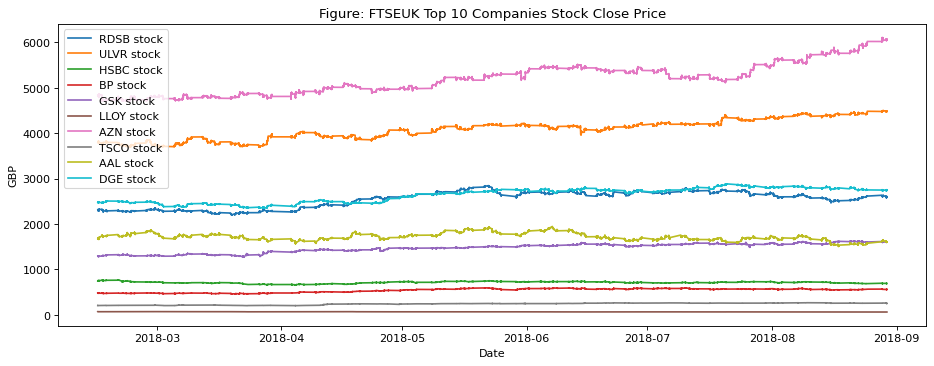

In [ ]:
plt.figure(figsize=(14, 5), dpi=80)
plt.plot(dataset_ex_df_RDSB['Dates'], dataset_ex_df_RDSB['Close'], label='RDSB stock')
plt.plot(dataset_ex_df_ULVR['Dates'], dataset_ex_df_ULVR['Close'], label='ULVR stock')
plt.plot(dataset_ex_df_HSBC['Dates'], dataset_ex_df_HSBC['Close'], label='HSBC stock')
plt.plot(dataset_ex_df_BP['Dates'], dataset_ex_df_BP['Close'], label='BP stock')
plt.plot(dataset_ex_df_GSK['Dates'], dataset_ex_df_GSK['Close'], label='GSK stock')
plt.plot(dataset_ex_df_LLOY['Dates'], dataset_ex_df_LLOY['Close'], label='LLOY stock')
plt.plot(dataset_ex_df_AZN['Dates'], dataset_ex_df_AZN['Close'], label='AZN stock')
plt.plot(dataset_ex_df_TSCO['Dates'], dataset_ex_df_TSCO['Close'], label='TSCO stock')
plt.plot(dataset_ex_df_AAL['Dates'], dataset_ex_df_AAL['Close'], label='AAL stock')
plt.plot(dataset_ex_df_DGE['Dates'], dataset_ex_df_DGE['Close'], label='DGE stock')
plt.xlabel('Date')
plt.ylabel('GBP')
plt.title('Figure: FTSEUK Top 10 Companies Stock Close Price')
plt.legend()
plt.show()

#Feature Generation

**1. Technical Indicators**

In [13]:
def get_technical_indicators(dataset): #function to generate feature technical indicators
    
    
    # Create 7 and 21 days Moving Average
    dataset['ma7'] = dataset['Close'].rolling(window = 7).mean()
    dataset['ma21'] = dataset['Close'].rolling(window = 21).mean()
    
    #Create MACD
    dataset['26ema'] = dataset['Close'].ewm(span=26).mean()
    dataset['12ema'] = dataset['Close'].ewm(span=12).mean()
    dataset['MACD'] = (dataset['12ema']-dataset['26ema'])
    
    #Create Bollinger Bands
    dataset['20sd'] = dataset['Close'].rolling(window = 20).std()
    dataset['upper_band'] = (dataset['Close'].rolling(window = 20).mean()) + (dataset['20sd']*2)
    dataset['lower_band'] = (dataset['Close'].rolling(window = 20).mean()) - (dataset['20sd']*2)
    
    
    #Create Exponential moving average
    dataset['ema'] = dataset['Close'].ewm(com=0.5).mean()
    
    #Create Momentum
    dataset['momentum'] = (dataset['Close']/100)-1
    
    
    
    return dataset

In [14]:
dataset_TI_df_RDSB = get_technical_indicators(dataset_ex_df_RDSB)
print(dataset_TI_df_RDSB.head())
dataset_TI_df_ULVR = get_technical_indicators(dataset_ex_df_ULVR)
print(dataset_TI_df_ULVR.head())
dataset_TI_df_HSBC = get_technical_indicators(dataset_ex_df_HSBC)
print(dataset_TI_df_HSBC.head())
dataset_TI_df_BP = get_technical_indicators(dataset_ex_df_BP)
print(dataset_TI_df_BP.head())
dataset_TI_df_GSK = get_technical_indicators(dataset_ex_df_GSK)
print(dataset_TI_df_GSK.head())
dataset_TI_df_LLOY = get_technical_indicators(dataset_ex_df_LLOY)
print(dataset_TI_df_LLOY.head())
dataset_TI_df_AZN = get_technical_indicators(dataset_ex_df_AZN)
print(dataset_TI_df_AZN.head())
dataset_TI_df_TSCO = get_technical_indicators(dataset_ex_df_TSCO)
print(dataset_TI_df_TSCO.head())
dataset_TI_df_AAL = get_technical_indicators(dataset_ex_df_AAL)
print(dataset_TI_df_AAL.head())
dataset_TI_df_DGE = get_technical_indicators(dataset_ex_df_DGE)
print(dataset_TI_df_DGE.head())

                Dates    Open   Close  ...  lower_band          ema  momentum
0 2018-02-14 08:00:00  2319.0  2315.5  ...         NaN  2315.500000    22.155
1 2018-02-14 08:01:00  2316.5  2314.0  ...         NaN  2314.375000    22.140
2 2018-02-14 08:02:00  2311.5  2306.0  ...         NaN  2308.576923    22.060
3 2018-02-14 08:03:00  2306.5  2306.5  ...         NaN  2307.175000    22.065
4 2018-02-14 08:04:00  2309.0  2309.0  ...         NaN  2308.396694    22.090

[5 rows x 17 columns]
                Dates    Open   Close  ...  lower_band          ema  momentum
0 2018-02-14 08:00:00  3805.0  3797.5  ...         NaN  3797.500000    36.975
1 2018-02-14 08:01:00  3801.0  3800.0  ...         NaN  3799.375000    37.000
2 2018-02-14 08:02:00  3797.0  3793.0  ...         NaN  3794.961538    36.930
3 2018-02-14 08:03:00  3796.0  3802.5  ...         NaN  3800.050000    37.025
4 2018-02-14 08:04:00  3801.0  3799.5  ...         NaN  3799.681818    36.995

[5 rows x 17 columns]
                Da

**2. Time Series Analysis using Fourier Transform**

In [15]:
data_FT_RDSB = dataset_ex_df_RDSB[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_RDSB['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [16]:
def get_fourier(dataset):
    data_FT_RDSB = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_RDSB['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [17]:
dataset_TI_df_RDSB = get_fourier(dataset_ex_df_RDSB)
dataset_TI_df_RDSB.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,2319.0,2315.5,2319.0,2315.5,64152800.0,27677,NaN,NaN,2315.500000,2315.500000,0.000000,NaN,NaN,NaN,2315.500000,22.155,2315.5
1,2018-02-14 08:01:00,2316.5,2314.0,2316.5,2312.5,39831632.0,17206,NaN,NaN,2314.721154,2314.687500,-0.033654,NaN,NaN,NaN,2314.375000,22.140,2314.0
2,2018-02-14 08:02:00,2311.5,2306.0,2312.0,2305.0,38951624.0,16871,NaN,NaN,2311.587728,2311.296767,-0.290961,NaN,NaN,NaN,2308.576923,22.060,2306.0


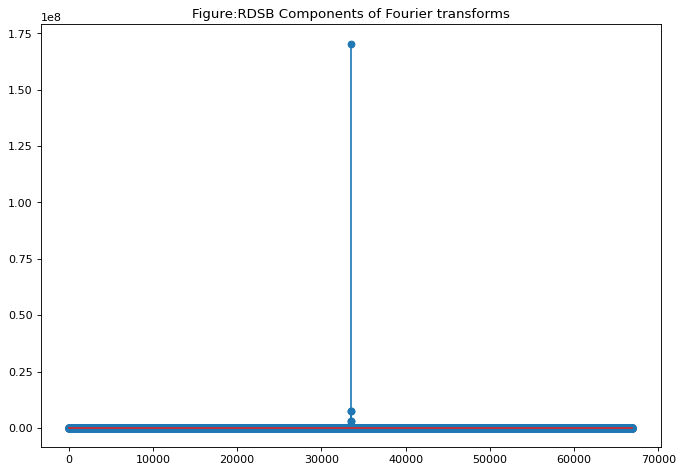

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:RDSB Components of Fourier transforms')
plt.show()

In [18]:
data_FT_ULVR = dataset_ex_df_ULVR[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_ULVR['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [19]:
def get_fourier(dataset):
    data_FT_ULVR = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_ULVR['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [20]:
dataset_TI_df_ULVR = get_fourier(dataset_ex_df_ULVR)
dataset_TI_df_ULVR.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,3805.0,3797.5,3806.0,3797.5,37356124.0,9819,NaN,NaN,3797.500000,3797.500000,0.00000,NaN,NaN,NaN,3797.500000,36.975,3797.5
1,2018-02-14 08:01:00,3801.0,3800.0,3801.0,3800.0,2485724.0,654,NaN,NaN,3798.798077,3798.854167,0.05609,NaN,NaN,NaN,3799.375000,37.000,3800.0
2,2018-02-14 08:02:00,3797.0,3793.0,3797.0,3793.0,2189957.0,577,NaN,NaN,3796.714884,3796.569284,-0.14560,NaN,NaN,NaN,3794.961538,36.930,3793.0


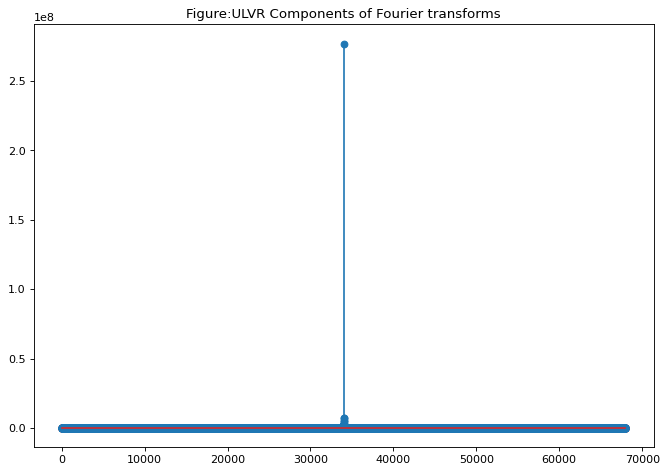

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:ULVR Components of Fourier transforms')
plt.show()

In [21]:
data_FT_HSBC = dataset_ex_df_HSBC[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_HSBC['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [22]:
def get_fourier(dataset):
    data_FT_HSBC = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_HSBC['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [23]:
dataset_TI_df_HSBC = get_fourier(dataset_ex_df_HSBC)
dataset_TI_df_HSBC.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,751.0,749.2,751.0,749.2,1.607910e+09,2141500,NaN,NaN,749.200000,749.200000,0.000000,NaN,NaN,NaN,749.200000,6.492,749.2
1,2018-02-14 08:01:00,749.2,749.9,750.4,749.2,3.732991e+08,497829,NaN,NaN,749.563462,749.579167,0.015705,NaN,NaN,NaN,749.725000,6.499,749.9
2,2018-02-14 08:02:00,749.7,749.8,750.2,749.7,1.793002e+08,239086,NaN,NaN,749.648448,749.665358,0.016910,NaN,NaN,NaN,749.776923,6.498,749.8


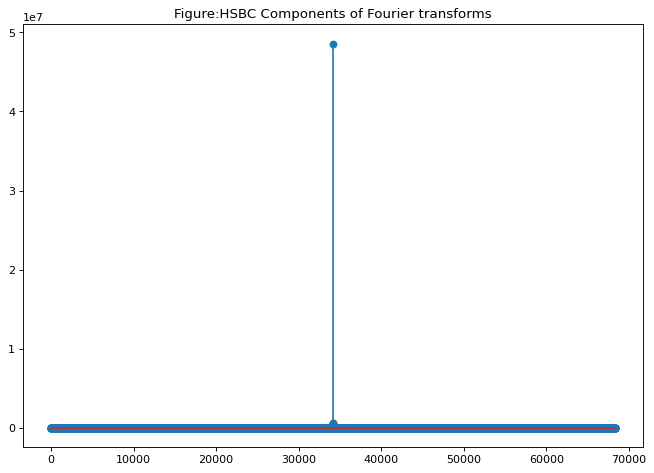

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:HSBC Components of Fourier transforms')
plt.show()

In [24]:
data_FT_BP = dataset_ex_df_BP[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_BP['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [25]:
def get_fourier(dataset):
    data_FT_BP = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_BP['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [26]:
dataset_TI_df_BP = get_fourier(dataset_ex_df_BP)
dataset_TI_df_BP.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,477.00,476.70,478.00,476.50,159848064.0,335104,NaN,NaN,476.700000,476.700000,0.000000,NaN,NaN,NaN,476.700000,3.7670,476.70
1,2018-02-14 08:01:00,477.05,476.25,477.05,476.25,8042873.0,16879,NaN,NaN,476.466346,476.456250,-0.010096,NaN,NaN,NaN,476.362500,3.7625,476.25
2,2018-02-14 08:02:00,476.05,475.00,476.05,475.00,20259088.0,42595,NaN,NaN,475.939502,475.887875,-0.051627,NaN,NaN,NaN,475.419231,3.7500,475.00


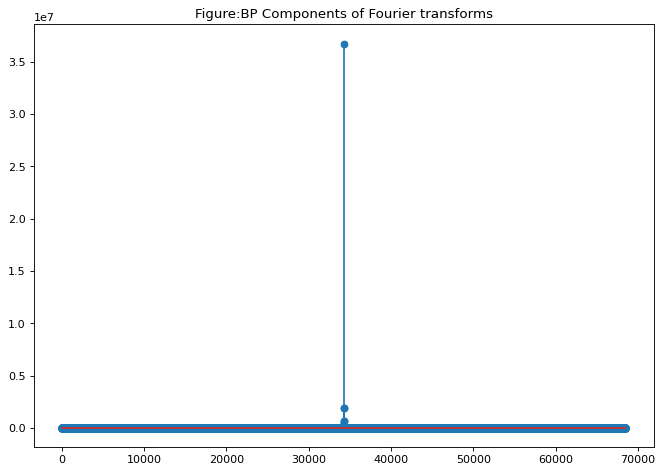

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:BP Components of Fourier transforms')
plt.show()

In [27]:
data_FT_GSK = dataset_ex_df_GSK[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_GSK['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [28]:
def get_fourier(dataset):
    data_FT_GSK = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_GSK['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [29]:
dataset_TI_df_GSK = get_fourier(dataset_ex_df_GSK)
dataset_TI_df_GSK.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:01:00,1293.4,1292.8,1294.0,1291.0,138270720.0,106922,NaN,NaN,1292.800000,1292.800000,0.000000,NaN,NaN,NaN,1292.800000,11.928,1292.8
1,2018-02-14 08:00:00,1292.8,1288.8,1293.0,1288.8,11703298.0,9062,NaN,NaN,1290.723077,1290.633333,-0.089744,NaN,NaN,NaN,1289.800000,11.888,1288.8
2,2018-02-14 08:02:00,1288.2,1286.4,1289.6,1286.0,47523808.0,36896,NaN,NaN,1289.169837,1288.981062,-0.188775,NaN,NaN,NaN,1287.446154,11.864,1286.4


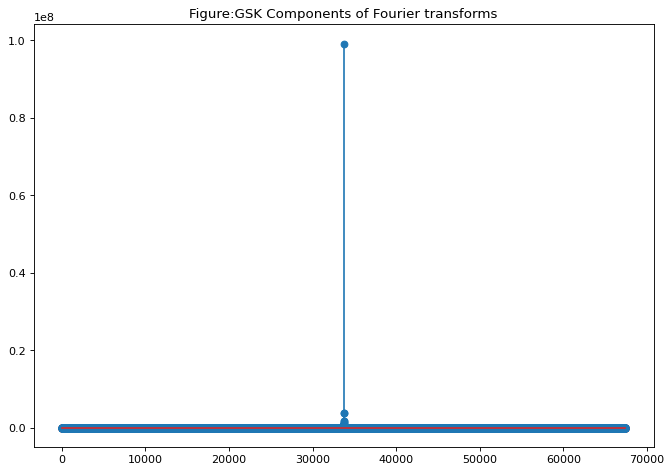

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:GSK Components of Fourier transforms')
plt.show()

In [30]:
data_FT_LLOY = dataset_ex_df_LLOY[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_LLOY['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [31]:
def get_fourier(dataset):
    data_FT_LLOY = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_LLOY['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [32]:
dataset_TI_df_LLOY = get_fourier(dataset_ex_df_LLOY)
dataset_TI_df_LLOY.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,67.00,67.07,67.07,66.98,145137808.0,2166164,NaN,NaN,67.070000,67.070000,0.000000,NaN,NaN,NaN,67.070000,-0.3293,67.07
1,2018-02-14 08:01:00,67.17,67.16,67.18,67.09,3393477.0,50537,NaN,NaN,67.116731,67.118750,0.002019,NaN,NaN,NaN,67.137500,-0.3284,67.16
2,2018-02-14 08:02:00,67.10,66.98,67.10,66.93,8503085.0,126862,NaN,NaN,67.067605,67.064596,-0.003009,NaN,NaN,NaN,67.028462,-0.3302,66.98


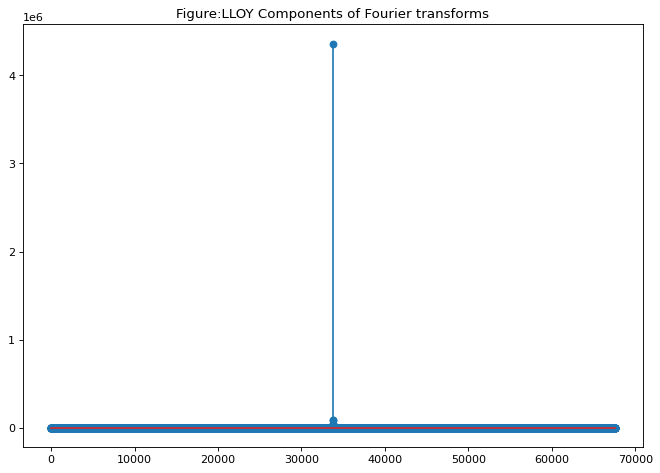

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:LLOY Components of Fourier transforms')
plt.show()

In [33]:
data_FT_AZN = dataset_ex_df_AZN[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_AZN['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [34]:
def get_fourier(dataset):
    data_FT_AZN = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_AZN['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [35]:
dataset_TI_df_AZN = get_fourier(dataset_ex_df_AZN)
dataset_TI_df_AZN.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,4835.5,4832.5,4838.0,4832.5,78754400.0,16286,NaN,NaN,4832.500000,4832.500000,0.000000,NaN,NaN,NaN,4832.500000,47.325,4832.5
1,2018-02-14 08:01:00,4832.5,4832.5,4832.5,4832.5,1560897.5,323,NaN,NaN,4832.500000,4832.500000,0.000000,NaN,NaN,NaN,4832.500000,47.325,4832.5
2,2018-02-14 08:02:00,4834.5,4830.0,4838.0,4830.0,12914301.0,2672,NaN,NaN,4831.601774,4831.524249,-0.077525,NaN,NaN,NaN,4830.769231,47.300,4830.0


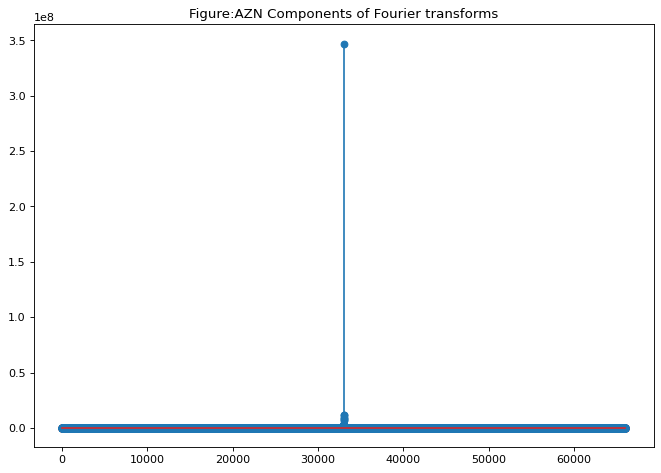

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:AZN Components of Fourier transforms')
plt.show()

In [36]:
data_FT_TSCO = dataset_ex_df_TSCO[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_TSCO['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [37]:
def get_fourier(dataset):
    data_FT_TSCO = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_TSCO['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [38]:
dataset_TI_df_TSCO = get_fourier(dataset_ex_df_TSCO)
dataset_TI_df_TSCO.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,204.0,204.0,204.0,204.0,5829504.0,28576,NaN,NaN,204.000000,204.000000,0.000000,NaN,NaN,NaN,204.000000,1.040,204.0
1,2018-02-14 08:01:00,204.1,204.1,204.1,204.1,913347.5,4475,NaN,NaN,204.051923,204.054167,0.002244,NaN,NaN,NaN,204.075000,1.041,204.1
2,2018-02-14 08:02:00,204.2,204.1,204.2,203.9,6534517.0,32026,NaN,NaN,204.069197,204.072055,0.002859,NaN,NaN,NaN,204.092308,1.041,204.1


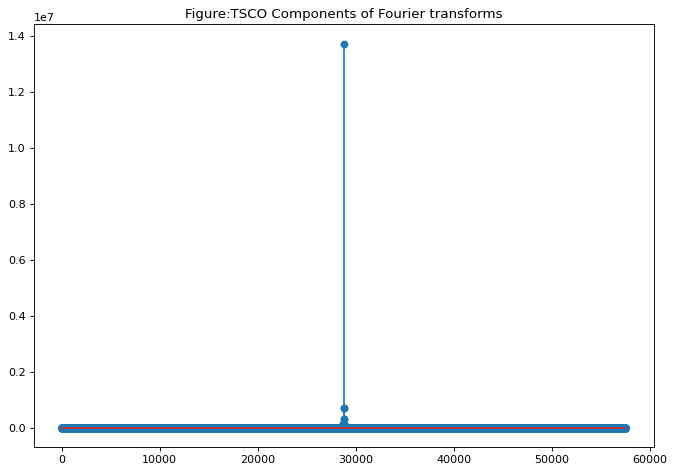

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:TSCO Components of Fourier transforms')
plt.show()

In [39]:
data_FT_AAL = dataset_ex_df_AAL[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_AAL['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [40]:
def get_fourier(dataset):
    data_FT_AAL = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_AAL['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [41]:
dataset_TI_df_AAL = get_fourier(dataset_ex_df_AAL)
dataset_TI_df_AAL.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,1682.0,1679.8,1682.0,1677.6,36935376.0,21978,NaN,NaN,1679.800000,1679.800000,0.000000,NaN,NaN,NaN,1679.800000,15.798,1679.8
1,2018-02-14 08:01:00,1679.8,1680.8,1681.6,1678.0,28434078.0,16930,NaN,NaN,1680.319231,1680.341667,0.022436,NaN,NaN,NaN,1680.550000,15.808,1680.8
2,2018-02-14 08:02:00,1681.2,1679.0,1681.2,1678.0,24295556.0,14466,NaN,NaN,1679.845244,1679.818014,-0.027230,NaN,NaN,NaN,1679.476923,15.790,1679.0


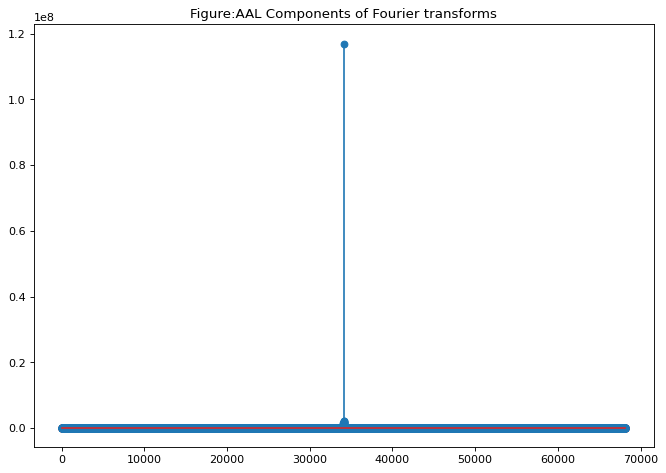

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:AAL Components of Fourier transforms')
plt.show()

In [42]:
data_FT_DGE = dataset_ex_df_DGE[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_DGE['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

In [43]:
def get_fourier(dataset):
    data_FT_DGE = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_DGE['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [44]:
dataset_TI_df_DGE = get_fourier(dataset_ex_df_DGE)
dataset_TI_df_DGE.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,2473.0,2473.0,2474.0,2472.0,92973784.0,37595,NaN,NaN,2473.000000,2473.000000,0.000000,NaN,NaN,NaN,2473.000000,23.730,2473.0
1,2018-02-14 08:01:00,2474.0,2474.5,2474.5,2474.0,2642458.5,1068,NaN,NaN,2473.778846,2473.812500,0.033654,NaN,NaN,NaN,2474.125000,23.745,2474.5
2,2018-02-14 08:02:00,2476.0,2475.0,2476.0,2475.0,19469766.0,7866,NaN,NaN,2474.217595,2474.275982,0.058387,NaN,NaN,NaN,2474.730769,23.750,2475.0


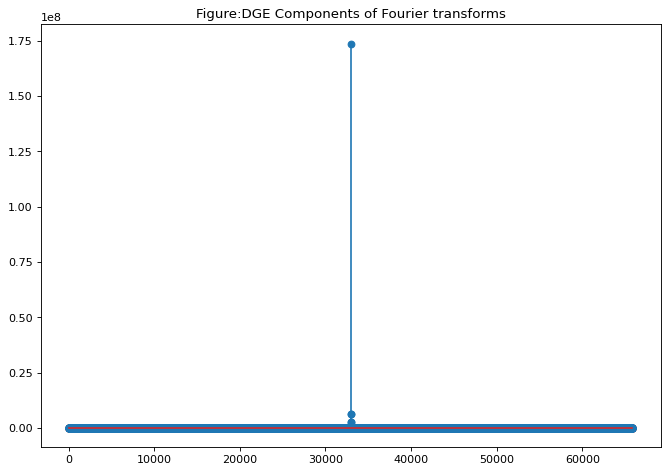

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:DGE Components of Fourier transforms')
plt.show()

**4. ARIMA model as a feature**

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_RDSB = data_FT_RDSB['Close']
model = ARIMA(series_RDSB, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                66931
Model:                 ARIMA(5, 1, 0)   Log Likelihood             -116010.118
Method:                       css-mle   S.D. of innovations              1.369
Date:                Sat, 22 Aug 2020   AIC                         232034.236
Time:                        14:43:59   BIC                         232098.016
Sample:                             1   HQIC                        232053.948
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0043      0.005      0.841      0.400      -0.006       0.014
ar.L1.D.Close    -0.0303      0.004     -7.835      0.000      -0.038      -0.023
ar.L2.D.Close  1.055e-05      0.004     

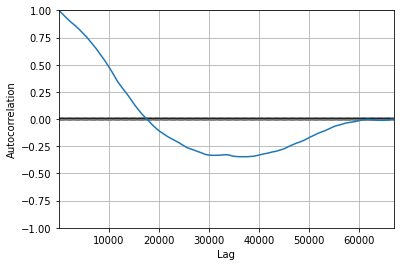

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_RDSB)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_RDSB.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_RDSB['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.969
Test MAE: 0.658
Test RMSE: 0.984
Test accuracy: 0.998


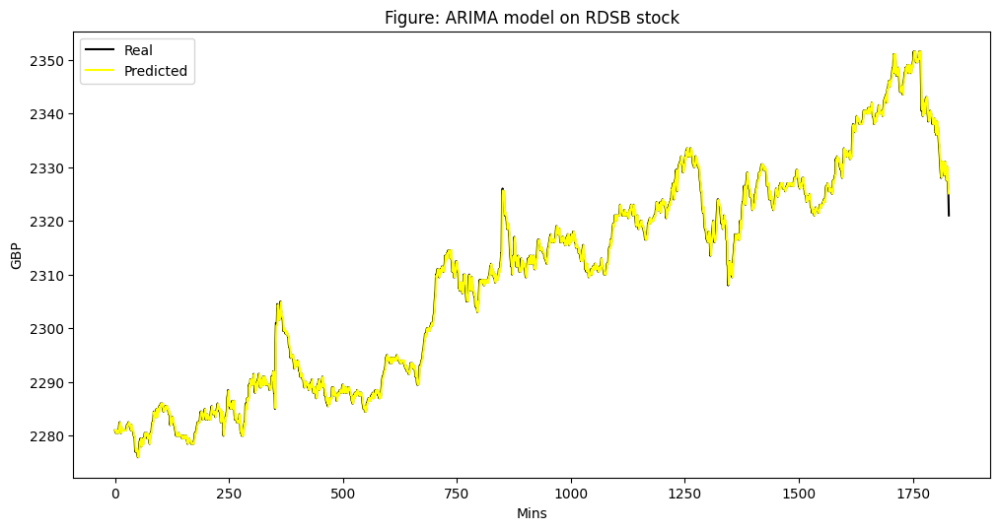

In [ ]:
# Plot the predicted (from ARIMA) and real prices
plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on RDSB stock')
plt.legend()
plt.show()

In [ ]:
dataset_ex_df_RDSB.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,2319.0,2315.5,2319.0,2315.5,64152800.0,27677,NaN,NaN,2315.500000,2315.500000,0.000000,NaN,NaN,NaN,2315.500000,22.155,2315.5
1,2018-02-14 08:01:00,2316.5,2314.0,2316.5,2312.5,39831632.0,17206,NaN,NaN,2314.721154,2314.687500,-0.033654,NaN,NaN,NaN,2314.375000,22.140,2314.0
2,2018-02-14 08:02:00,2311.5,2306.0,2312.0,2305.0,38951624.0,16871,NaN,NaN,2311.587728,2311.296767,-0.290961,NaN,NaN,NaN,2308.576923,22.060,2306.0


In [ ]:
dataset_ex_df_RDSB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66932 entries, 0 to 66931
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       66932 non-null  datetime64[ns]
 1   Open        66932 non-null  float64       
 2   Close       66932 non-null  float64       
 3   High        66932 non-null  float64       
 4   Low         66932 non-null  float64       
 5   Value       66932 non-null  float64       
 6   Volume      66932 non-null  int64         
 7   ma7         66926 non-null  float64       
 8   ma21        66912 non-null  float64       
 9   26ema       66932 non-null  float64       
 10  12ema       66932 non-null  float64       
 11  MACD        66932 non-null  float64       
 12  20sd        66913 non-null  float64       
 13  upper_band  66913 non-null  float64       
 14  lower_band  66913 non-null  float64       
 15  ema         66932 non-null  float64       
 16  momentum    66932 non-

In [ ]:
print('Total RDSB dataset has {} samples, and {} features.'.format(dataset_ex_df_RDSB.shape[0], \
                                                              dataset_ex_df_RDSB.shape[1]))

Total RDSB dataset has 66932 samples, and 18 features.


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_ULVR = data_FT_ULVR['Close']
model = ARIMA(series_ULVR, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                67971
Model:                 ARIMA(5, 1, 0)   Log Likelihood             -139202.134
Method:                       css-mle   S.D. of innovations              1.876
Date:                Sat, 22 Aug 2020   AIC                         278418.267
Time:                        14:45:08   BIC                         278482.155
Sample:                             1   HQIC                        278437.998
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0101      0.007      1.460      0.144      -0.003       0.024
ar.L1.D.Close    -0.0439      0.004    -11.442      0.000      -0.051      -0.036
ar.L2.D.Close     0.0137      0.004     

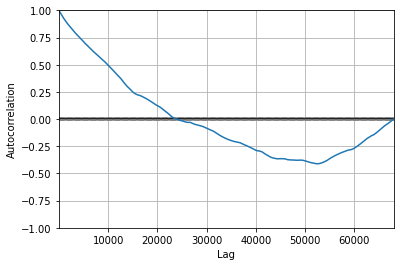

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_ULVR)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_ULVR.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_ULVR['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 3.251
Test MAE: 1.240
Test RMSE: 1.803
Test accuracy: 0.997


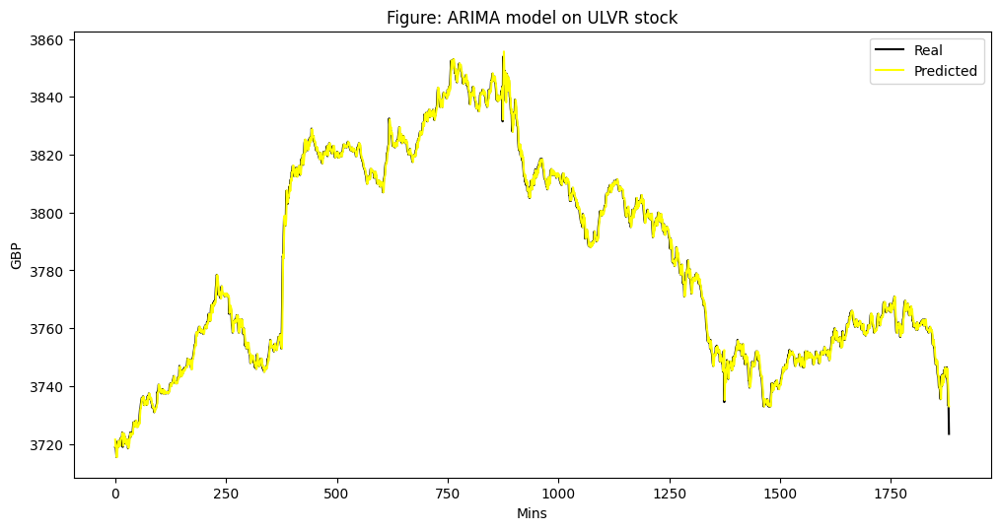

In [ ]:
# Plot the predicted (from ARIMA) and real prices
plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on ULVR stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_ULVR.head(3))
print(dataset_ex_df_ULVR.info())
print('\n Total ULVR dataset has {} samples, and {} features.'.format(dataset_ex_df_ULVR.shape[0], \
                                                              dataset_ex_df_ULVR.shape[1]))

                Dates    Open   Close  ...          ema  momentum  Fourier
0 2018-02-14 08:00:00  3805.0  3797.5  ...  3797.500000    36.975   3797.5
1 2018-02-14 08:01:00  3801.0  3800.0  ...  3799.375000    37.000   3800.0
2 2018-02-14 08:02:00  3797.0  3793.0  ...  3794.961538    36.930   3793.0

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67972 entries, 0 to 67971
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       67972 non-null  datetime64[ns]
 1   Open        67972 non-null  float64       
 2   Close       67972 non-null  float64       
 3   High        67972 non-null  float64       
 4   Low         67972 non-null  float64       
 5   Value       67972 non-null  float64       
 6   Volume      67972 non-null  int64         
 7   ma7         67966 non-null  float64       
 8   ma21        67952 non-null  float64       
 9   26ema       67972 non-null  float64

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_HSBC = data_FT_HSBC['Close']
model = ARIMA(series_HSBC, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                68285
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -21175.161
Method:                       css-mle   S.D. of innovations              0.330
Date:                Sat, 22 Aug 2020   AIC                          42364.322
Time:                        15:02:55   BIC                          42428.242
Sample:                             1   HQIC                         42384.059
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0009      0.001     -0.710      0.478      -0.003       0.002
ar.L1.D.Close    -0.0049      0.004     -1.291      0.197      -0.012       0.003
ar.L2.D.Close    -0.0086      0.004     

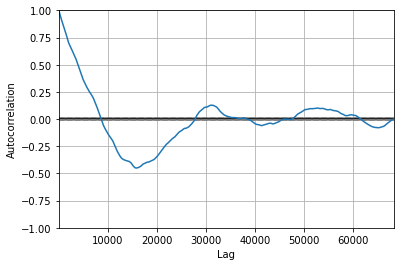

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_HSBC)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_HSBC.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_HSBC['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.069
Test MAE: 0.176
Test RMSE: 0.262
Test accuracy: 0.991


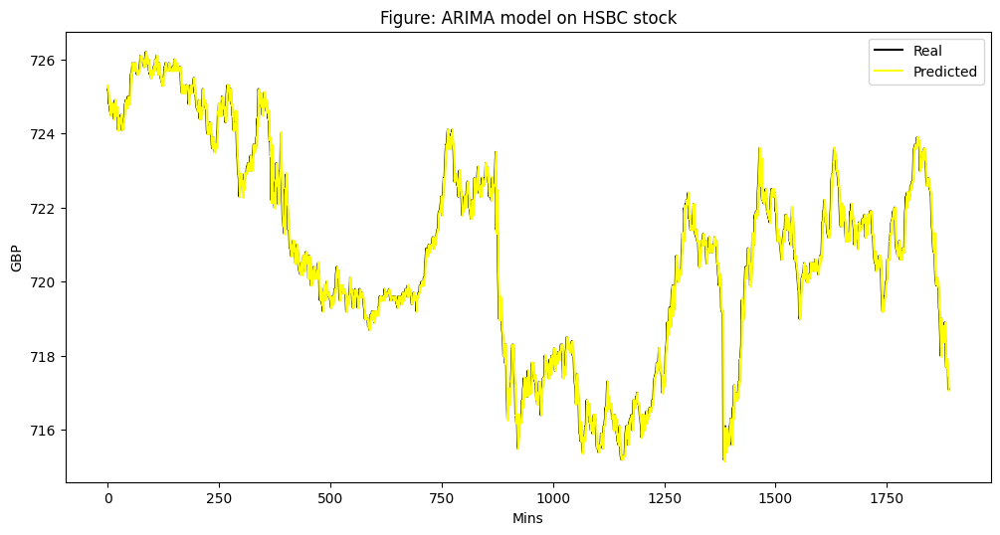

In [ ]:
# Plot the predicted (from ARIMA) and real prices
plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on HSBC stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_HSBC.head(3))
print(dataset_ex_df_HSBC.info())
print('\n Total HSBC dataset has {} samples, and {} features.'.format(dataset_ex_df_HSBC.shape[0], \
                                                              dataset_ex_df_HSBC.shape[1]))

                Dates   Open  Close  ...         ema  momentum  Fourier
0 2018-02-14 08:00:00  751.0  749.2  ...  749.200000     6.492    749.2
1 2018-02-14 08:01:00  749.2  749.9  ...  749.725000     6.499    749.9
2 2018-02-14 08:02:00  749.7  749.8  ...  749.776923     6.498    749.8

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68286 entries, 0 to 68285
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       68286 non-null  datetime64[ns]
 1   Open        68286 non-null  float64       
 2   Close       68286 non-null  float64       
 3   High        68286 non-null  float64       
 4   Low         68286 non-null  float64       
 5   Value       68286 non-null  float64       
 6   Volume      68286 non-null  int64         
 7   ma7         68280 non-null  float64       
 8   ma21        68266 non-null  float64       
 9   26ema       68286 non-null  float64       
 10 

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_BP = data_FT_BP['Close']
model = ARIMA(series_BP, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                68448
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -14879.241
Method:                       css-mle   S.D. of innovations              0.301
Date:                Sat, 22 Aug 2020   AIC                          29772.482
Time:                        15:03:54   BIC                          29836.419
Sample:                             1   HQIC                         29792.222
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0012      0.001      1.060      0.289      -0.001       0.003
ar.L1.D.Close    -0.0222      0.004     -5.807      0.000      -0.030      -0.015
ar.L2.D.Close     0.0048      0.004     

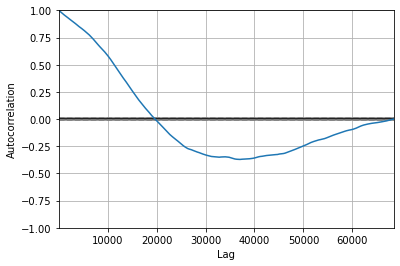

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_BP)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_BP.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_BP['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.052
Test MAE: 0.141
Test RMSE: 0.229
Test accuracy: 0.995


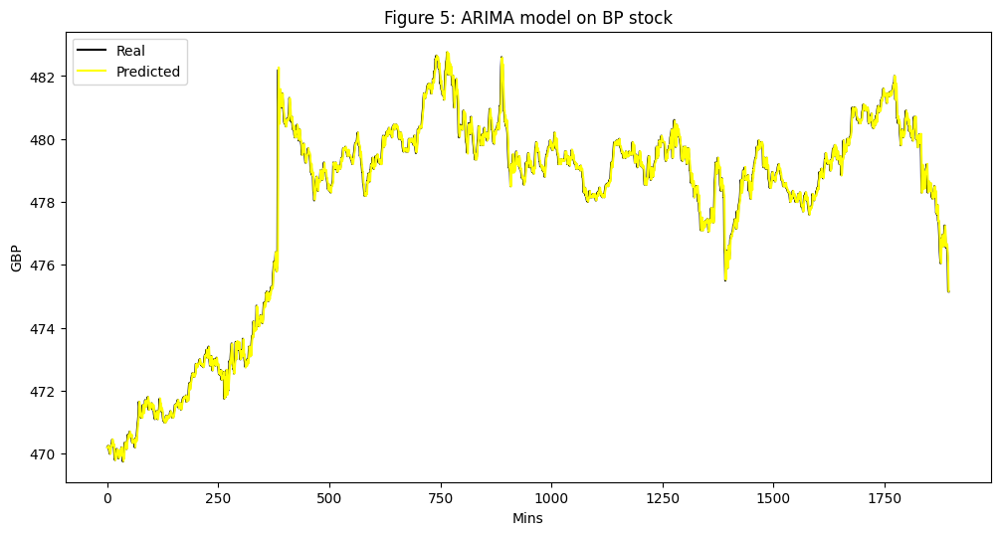

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure 5: ARIMA model on BP stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_BP.head(3))
print(dataset_ex_df_BP.info())
print('\n Total BP dataset has {} samples, and {} features.'.format(dataset_ex_df_BP.shape[0], \
                                                              dataset_ex_df_BP.shape[1]))

                Dates    Open   Close  ...         ema  momentum  Fourier
0 2018-02-14 08:00:00  477.00  476.70  ...  476.700000    3.7670   476.70
1 2018-02-14 08:01:00  477.05  476.25  ...  476.362500    3.7625   476.25
2 2018-02-14 08:02:00  476.05  475.00  ...  475.419231    3.7500   475.00

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68449 entries, 0 to 68448
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       68449 non-null  datetime64[ns]
 1   Open        68449 non-null  float64       
 2   Close       68449 non-null  float64       
 3   High        68449 non-null  float64       
 4   Low         68449 non-null  float64       
 5   Value       68449 non-null  float64       
 6   Volume      68449 non-null  int64         
 7   ma7         68443 non-null  float64       
 8   ma21        68429 non-null  float64       
 9   26ema       68449 non-null  float64    

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_GSK = data_FT_GSK['Close']
model = ARIMA(series_GSK, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                67418
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -79253.928
Method:                       css-mle   S.D. of innovations              0.784
Date:                Sat, 22 Aug 2020   AIC                         158521.856
Time:                        15:06:07   BIC                         158585.687
Sample:                             1   HQIC                        158541.577
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0045      0.003      1.559      0.119      -0.001       0.010
ar.L1.D.Close    -0.0104      0.004     -2.699      0.007      -0.018      -0.003
ar.L2.D.Close     0.0051      0.004     

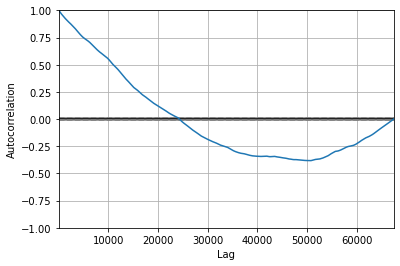

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_GSK)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame

X = series_GSK.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_GSK['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.283
Test MAE: 0.332
Test RMSE: 0.532
Test accuracy: 0.994


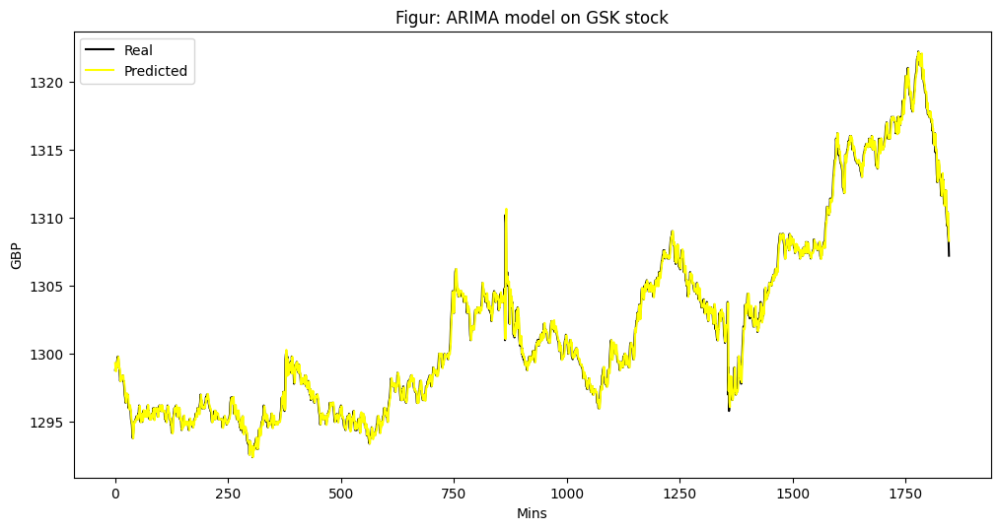

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figur: ARIMA model on GSK stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_GSK.head(3))
print(dataset_ex_df_GSK.info())
print('\n Total GSK dataset has {} samples, and {} features.'.format(dataset_ex_df_GSK.shape[0], \
                                                              dataset_ex_df_GSK.shape[1]))

                Dates    Open   Close  ...          ema  momentum  Fourier
0 2018-02-14 08:01:00  1293.4  1292.8  ...  1292.800000    11.928   1292.8
1 2018-02-14 08:00:00  1292.8  1288.8  ...  1289.800000    11.888   1288.8
2 2018-02-14 08:02:00  1288.2  1286.4  ...  1287.446154    11.864   1286.4

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67419 entries, 0 to 67418
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       67419 non-null  datetime64[ns]
 1   Open        67419 non-null  float64       
 2   Close       67419 non-null  float64       
 3   High        67419 non-null  float64       
 4   Low         67419 non-null  float64       
 5   Value       67419 non-null  float64       
 6   Volume      67419 non-null  int64         
 7   ma7         67413 non-null  float64       
 8   ma21        67399 non-null  float64       
 9   26ema       67419 non-null  float64

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_LLOY = data_FT_LLOY['Close']
model = ARIMA(series_LLOY, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                67528
Model:                 ARIMA(5, 1, 0)   Log Likelihood              135222.357
Method:                       css-mle   S.D. of innovations              0.033
Date:                Sat, 22 Aug 2020   AIC                        -270430.714
Time:                        15:07:15   BIC                        -270366.872
Sample:                             1   HQIC                       -270410.991
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0001      0.000     -0.898      0.369      -0.000       0.000
ar.L1.D.Close    -0.0444      0.004    -11.547      0.000      -0.052      -0.037
ar.L2.D.Close    -0.0144      0.004     

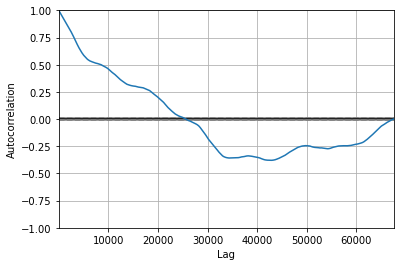

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_LLOY)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_LLOY.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_LLOY['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.001
Test MAE: 0.018
Test RMSE: 0.028
Test accuracy: 0.985


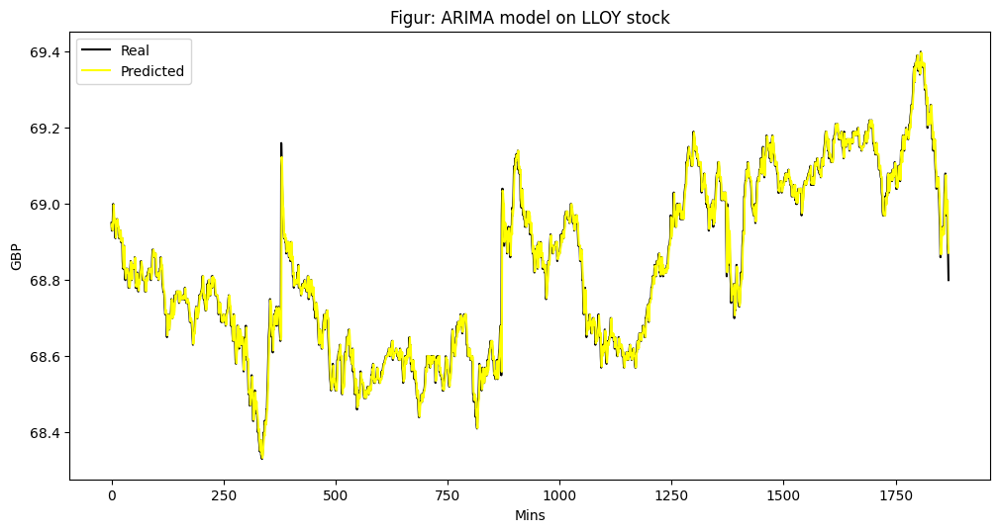

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figur: ARIMA model on LLOY stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_LLOY.head(3))
print(dataset_ex_df_LLOY.info())
print('\n Total LLOY dataset has {} samples, and {} features.'.format(dataset_ex_df_LLOY.shape[0], \
                                                              dataset_ex_df_LLOY.shape[1]))

                Dates   Open  Close  ...        ema  momentum  Fourier
0 2018-02-14 08:00:00  67.00  67.07  ...  67.070000   -0.3293    67.07
1 2018-02-14 08:01:00  67.17  67.16  ...  67.137500   -0.3284    67.16
2 2018-02-14 08:02:00  67.10  66.98  ...  67.028462   -0.3302    66.98

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67529 entries, 0 to 67528
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       67529 non-null  datetime64[ns]
 1   Open        67529 non-null  float64       
 2   Close       67529 non-null  float64       
 3   High        67529 non-null  float64       
 4   Low         67529 non-null  float64       
 5   Value       67529 non-null  float64       
 6   Volume      67529 non-null  int64         
 7   ma7         67523 non-null  float64       
 8   ma21        67509 non-null  float64       
 9   26ema       67529 non-null  float64       
 10  12e

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_AZN = data_FT_AZN['Close']
model = ARIMA(series_AZN, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                65994
Model:                 ARIMA(5, 1, 0)   Log Likelihood             -161135.684
Method:                       css-mle   S.D. of innovations              2.781
Date:                Sat, 22 Aug 2020   AIC                         322285.368
Time:                        15:09:13   BIC                         322349.049
Sample:                             1   HQIC                        322305.062
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0167      0.010      1.631      0.103      -0.003       0.037
ar.L1.D.Close    -0.0373      0.004     -9.573      0.000      -0.045      -0.030
ar.L2.D.Close    -0.0140      0.004     

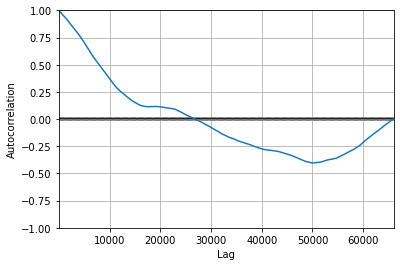

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_AZN)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_AZN.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_AZN['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 4.146
Test MAE: 1.387
Test RMSE: 2.036
Test accuracy: 0.996


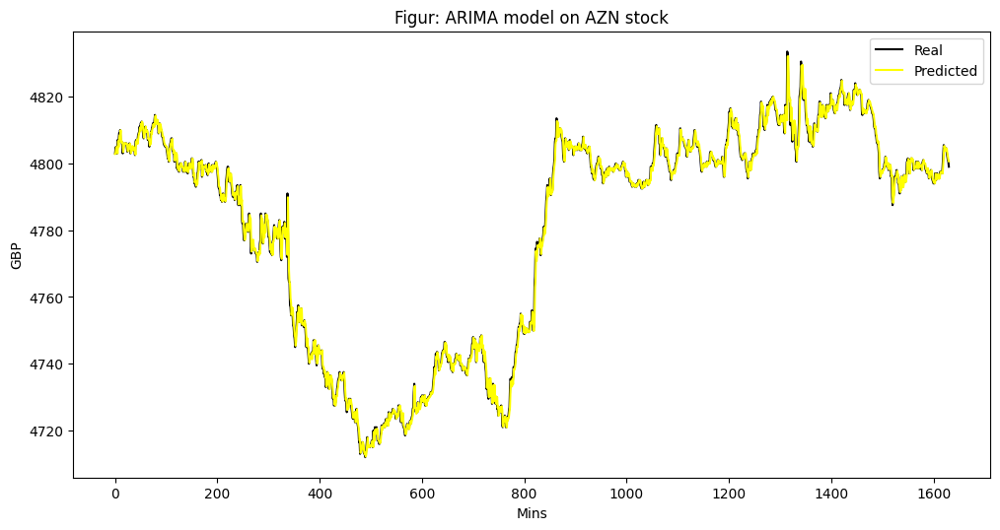

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figur: ARIMA model on AZN stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_AZN.head(3))
print(dataset_ex_df_AZN.info())
print('\n Total AZN dataset has {} samples, and {} features.'.format(dataset_ex_df_AZN.shape[0], \
                                                              dataset_ex_df_AZN.shape[1]))

                Dates    Open   Close  ...          ema  momentum  Fourier
0 2018-02-14 08:00:00  4835.5  4832.5  ...  4832.500000    47.325   4832.5
1 2018-02-14 08:01:00  4832.5  4832.5  ...  4832.500000    47.325   4832.5
2 2018-02-14 08:02:00  4834.5  4830.0  ...  4830.769231    47.300   4830.0

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65995 entries, 0 to 65994
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       60244 non-null  datetime64[ns]
 1   Open        65995 non-null  float64       
 2   Close       65995 non-null  float64       
 3   High        65995 non-null  float64       
 4   Low         65995 non-null  float64       
 5   Value       65995 non-null  float64       
 6   Volume      65995 non-null  int64         
 7   ma7         65989 non-null  float64       
 8   ma21        65975 non-null  float64       
 9   26ema       65995 non-null  float64

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_TSCO = data_FT_TSCO['Close']
model = ARIMA(series_TSCO, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                57525
Model:                 ARIMA(5, 1, 0)   Log Likelihood               25446.627
Method:                       css-mle   S.D. of innovations              0.155
Date:                Sat, 22 Aug 2020   AIC                         -50879.254
Time:                        15:10:27   BIC                         -50816.534
Sample:                             1   HQIC                        -50859.735
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0008      0.001      1.324      0.185      -0.000       0.002
ar.L1.D.Close    -0.0517      0.004    -12.403      0.000      -0.060      -0.044
ar.L2.D.Close     0.0059      0.004     

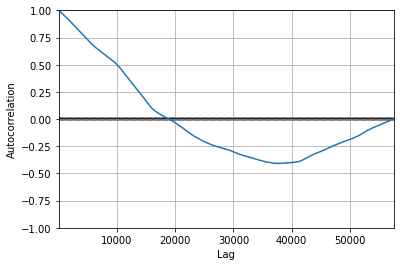

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_TSCO)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_TSCO.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_TSCO['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.021
Test MAE: 0.092
Test RMSE: 0.146
Test accuracy: 0.997


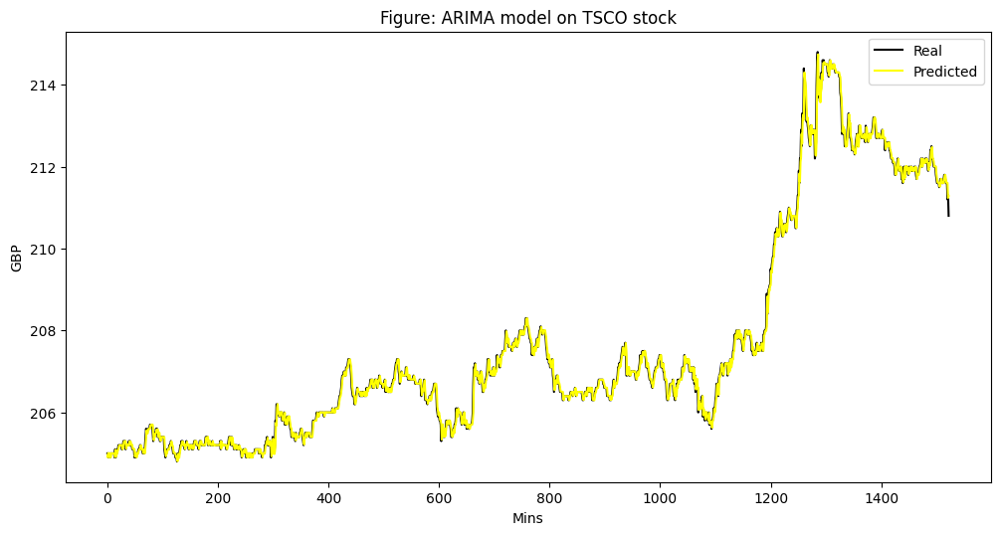

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on TSCO stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_TSCO.head(3))
print(dataset_ex_df_TSCO.info())
print('\n Total TSCO dataset has {} samples, and {} features.'.format(dataset_ex_df_TSCO.shape[0], \
                                                              dataset_ex_df_TSCO.shape[1]))

                Dates   Open  Close  ...         ema  momentum  Fourier
0 2018-02-14 08:00:00  204.0  204.0  ...  204.000000     1.040    204.0
1 2018-02-14 08:01:00  204.1  204.1  ...  204.075000     1.041    204.1
2 2018-02-14 08:02:00  204.2  204.1  ...  204.092308     1.041    204.1

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57526 entries, 0 to 57525
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       57526 non-null  datetime64[ns]
 1   Open        57526 non-null  float64       
 2   Close       57526 non-null  float64       
 3   High        57526 non-null  float64       
 4   Low         57526 non-null  float64       
 5   Value       57526 non-null  float64       
 6   Volume      57526 non-null  int64         
 7   ma7         57520 non-null  float64       
 8   ma21        57506 non-null  float64       
 9   26ema       57526 non-null  float64       
 10 

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_AAL = data_FT_AAL['Close']
model = ARIMA(series_AAL, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                68166
Model:                 ARIMA(5, 1, 0)   Log Likelihood             -132826.212
Method:                       css-mle   S.D. of innovations              1.698
Date:                Sat, 22 Aug 2020   AIC                         265666.423
Time:                        15:11:39   BIC                         265730.331
Sample:                             1   HQIC                        265686.158
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0011      0.006     -0.167      0.868      -0.014       0.012
ar.L1.D.Close    -0.0097      0.004     -2.538      0.011      -0.017      -0.002
ar.L2.D.Close     0.0115      0.004     

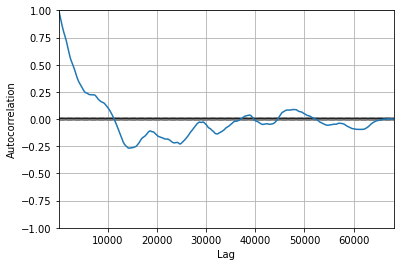

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_AAL)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_AAL.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_AAL['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 2.349
Test MAE: 1.007
Test RMSE: 1.533
Test accuracy: 0.996


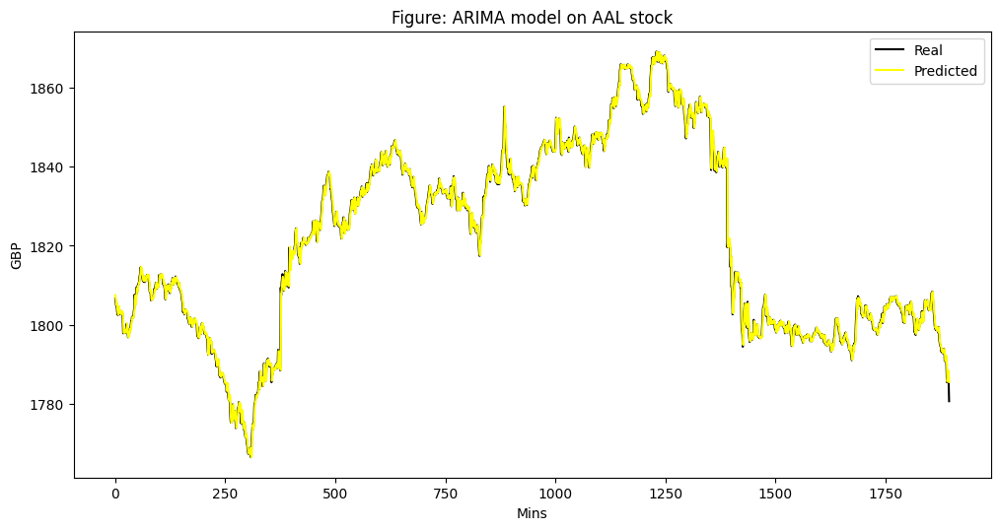

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on AAL stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_AAL.head(3))
print(dataset_ex_df_AAL.info())
print('\n Total AAL dataset has {} samples, and {} features.'.format(dataset_ex_df_AAL.shape[0], \
                                                              dataset_ex_df_AAL.shape[1]))

                Dates    Open   Close  ...          ema  momentum  Fourier
0 2018-02-14 08:00:00  1682.0  1679.8  ...  1679.800000    15.798   1679.8
1 2018-02-14 08:01:00  1679.8  1680.8  ...  1680.550000    15.808   1680.8
2 2018-02-14 08:02:00  1681.2  1679.0  ...  1679.476923    15.790   1679.0

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68167 entries, 0 to 68166
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       68167 non-null  datetime64[ns]
 1   Open        68167 non-null  float64       
 2   Close       68167 non-null  float64       
 3   High        68167 non-null  float64       
 4   Low         68167 non-null  float64       
 5   Value       68167 non-null  float64       
 6   Volume      68167 non-null  int64         
 7   ma7         68161 non-null  float64       
 8   ma21        68147 non-null  float64       
 9   26ema       68167 non-null  float64

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_DGE = data_FT_DGE['Close']
model = ARIMA(series_DGE, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                65849
Model:                 ARIMA(5, 1, 0)   Log Likelihood             -103587.321
Method:                       css-mle   S.D. of innovations              1.167
Date:                Sat, 22 Aug 2020   AIC                         207188.642
Time:                        15:12:34   BIC                         207252.308
Sample:                             1   HQIC                        207208.333
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0041      0.004      0.979      0.327      -0.004       0.012
ar.L1.D.Close    -0.0532      0.004    -13.663      0.000      -0.061      -0.046
ar.L2.D.Close    -0.0093      0.004     

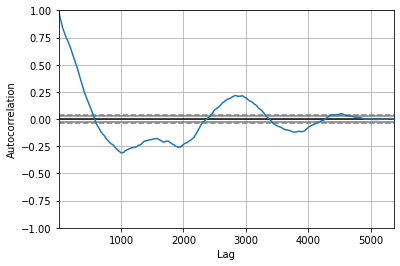

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_DGE)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_DGE.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_DGE['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.809
Test MAE: 0.630
Test RMSE: 0.899
Test accuracy: 0.992


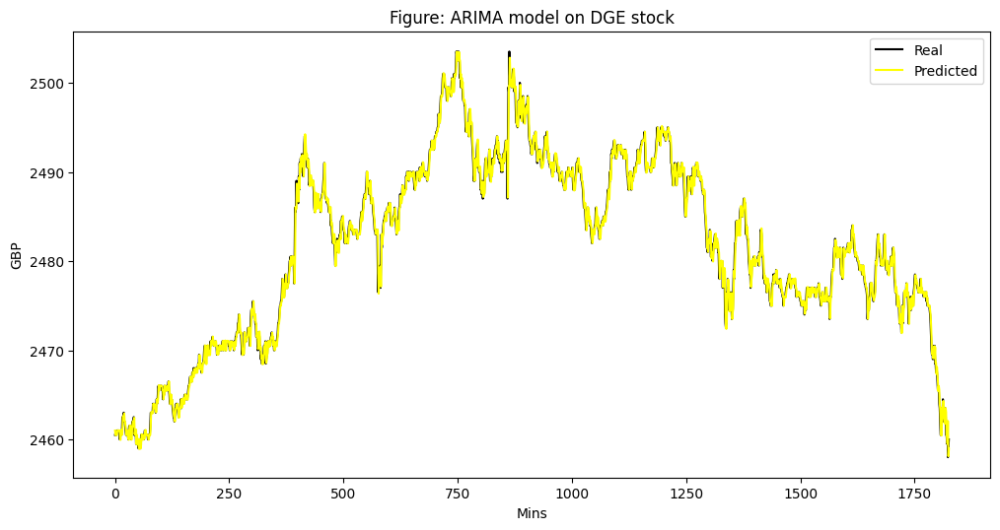

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on DGE stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_DGE.head(3))
print(dataset_ex_df_DGE.info())
print('\n Total DGE dataset has {} samples, and {} features.'.format(dataset_ex_df_DGE.shape[0], \
                                                              dataset_ex_df_DGE.shape[1]))

                Dates    Open   Close  ...          ema  momentum  Fourier
0 2018-02-14 08:00:00  2473.0  2473.0  ...  2473.000000    23.730   2473.0
1 2018-02-14 08:01:00  2474.0  2474.5  ...  2474.125000    23.745   2474.5
2 2018-02-14 08:02:00  2476.0  2475.0  ...  2474.730769    23.750   2475.0

[3 rows x 18 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65850 entries, 0 to 65849
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       65850 non-null  datetime64[ns]
 1   Open        65850 non-null  float64       
 2   Close       65850 non-null  float64       
 3   High        65850 non-null  float64       
 4   Low         65850 non-null  float64       
 5   Value       65850 non-null  float64       
 6   Volume      65850 non-null  int64         
 7   ma7         65844 non-null  float64       
 8   ma21        65830 non-null  float64       
 9   26ema       65850 non-null  float64

**Correlated Assets**

In [ ]:
from google.colab import files
uploaded11 = files.upload()

Saving CA.xlsx to CA.xlsx


In [ ]:
import io
dataset_CA = pd.read_excel(io.BytesIO(uploaded11['CA.xlsx']))
dataset_CA.head(3)

,Dates,RDSB,AAL,ABF,AHT,ANTO,AV,AZN,BA,BARC,BATS,BDEV,BKG,BLND,BLT,BNZL,BP,BRBY,BTA,CCH,CCL,CAN,CPG,CRDA,CRH,DCC,DGE,DLG,EVR,EXPN,EZJ,FERG,FRES,GLEN,GSK,GVC,HL,HLMA,HSBC,IAG,...,OCDO,PPB,PRU,PSN,PSON,RB,RBS,RDSA,RIO,REL,RMG,RMV,RR,RRS,RSA,RTO,SDR,SBRY,SGE,SGRO,SHP,SKG,SKY,SLA,SMIN,SMT,SMDS,SSE,SN,STAN,STJ,SVT,TSCO,TUI,TW,ULVR,UU,VOD,WPP,WTB
0,2018-02-14 08:00:00,2315.5,1679.8,2611.0,2016.0,894.4,501.0,4832.5,571.8,194.86,4437.5,557.4,3802.0,643.6,1534.6,2016.0,476.70,1520.5,228.95,2296.0,4896.0,126.8,1514.5,4353.0,2479.0,6860.0,2473.0,387.9,366.4,1521.0,1644.5,5170.0,1282.5,378.3,1292.8,879.0,1656.5,1199.0,749.2,606.2,...,475.1,8100.0,1816.5,2442.0,659.6,6417.0,276.8,2295.5,3983.5,1468.0,538.6,4276.0,831.4,6130.0,605.2,283.5,3391.0,248.2,686.8,558.0,3182.5,2486.0,1096.5,403.6,1548.0,446.4,473.6,1189.0,1252.5,816.2,1133.5,1731.5,204.0,1589.0,186.3,3797.5,665.8,201.45,1339.5,3815.0
1,2018-02-14 08:01:00,2314.0,1680.8,2612.0,2014.0,894.2,500.4,4832.5,571.4,195.14,4462.0,557.6,3806.0,642.8,1533.2,2021.0,476.25,1522.5,228.45,2307.0,4889.0,126.8,1517.5,4351.0,2478.0,6850.0,2474.5,388.3,365.9,1523.0,1643.0,5176.0,1282.5,378.3,1288.8,882.0,1655.5,1199.0,749.9,606.6,...,474.6,8115.0,1827.0,2450.0,659.6,6423.0,277.2,2293.5,3978.0,1470.5,538.8,4282.0,831.6,6128.0,605.2,283.3,3386.0,247.6,684.8,558.0,3185.5,2482.0,1095.5,401.8,1532.0,445.8,473.3,1190.5,1253.0,814.6,1136.5,1726.0,204.1,1580.0,186.5,3800.5,665.8,201.55,1345.5,3818.0
2,2018-02-14 08:02:00,2306.0,1679.0,2611.0,2012.0,896.8,499.2,4830.0,572.0,195.00,4449.5,557.6,3798.0,642.6,1533.0,2021.0,475.00,1524.0,227.05,2299.0,4881.0,126.8,1517.0,4359.0,2481.0,6835.0,2475.0,387.7,366.5,1521.0,1642.0,5168.0,1279.5,378.4,1286.4,880.0,1654.0,1195.0,749.8,608.0,...,473.0,8105.0,1820.0,2447.0,661.4,6418.0,277.5,2286.5,3976.0,1468.5,538.6,4295.0,832.8,6130.0,605.2,283.6,3390.0,247.5,684.0,558.0,3188.5,2488.0,1093.5,401.7,1532.5,446.2,473.5,1188.0,1253.0,814.1,1135.0,1724.5,204.1,1582.0,186.4,3800.0,664.6,201.10,1343.0,3815.0


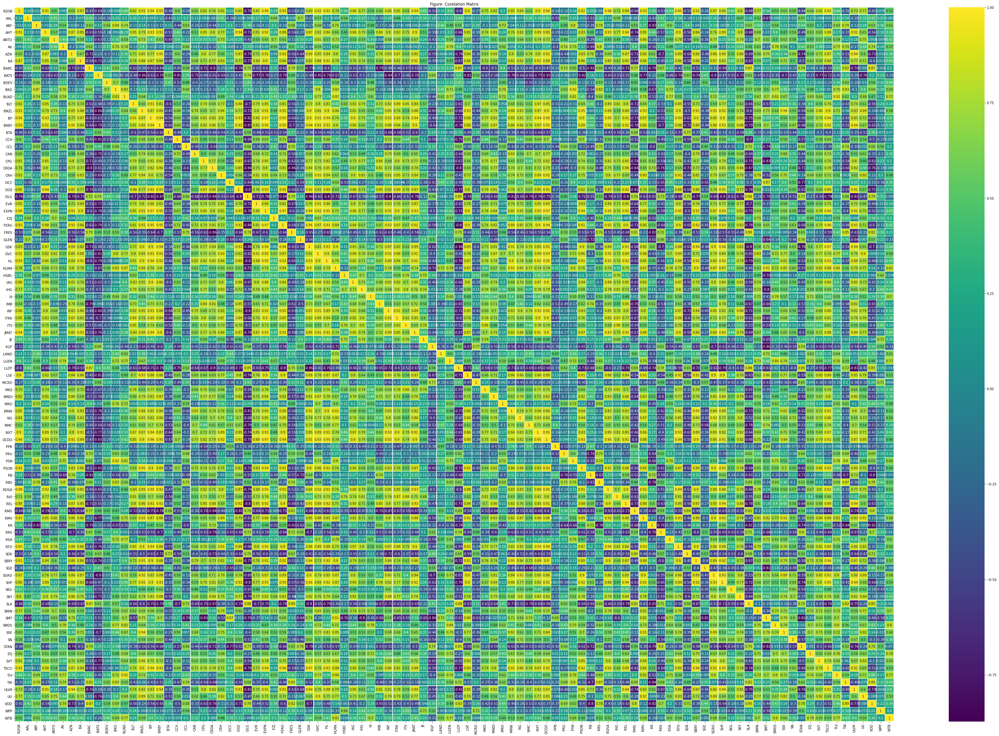

In [ ]:
import seaborn as sns
cor1=dataset_CA.corr(method='pearson')
plt.figure(figsize=(60, 40))
plt.title("Figure: Corelation Matrix")
cm=plt.cm.viridis
corr = sns.heatmap(cor1,cmap=cm,linewidths=0.1,linecolor='white',annot=True)
plt.show()

In [ ]:
cor_target_RDSB = abs(cor1["RDSB"])
cor_target_ULVR = abs(cor1["ULVR"])
cor_target_HSBC = abs(cor1["HSBC"])
cor_target_BP = abs(cor1["BP"])
cor_target_GSK = abs(cor1["GSK"])
cor_target_LLOY = abs(cor1["LLOY"])
cor_target_AZN = abs(cor1["AZN"])
cor_target_TSCO = abs(cor1["TSCO"])
cor_target_AAL = abs(cor1["AAL"])
cor_target_DGE = abs(cor1["DGE"])


relevant_features_RDSB = cor_target_RDSB[cor_target_RDSB>0.70]
relevant_features_ULVR = cor_target_ULVR[cor_target_ULVR>0.70]
relevant_features_HSBC = cor_target_HSBC[cor_target_HSBC>0.70]
relevant_features_BP = cor_target_BP[cor_target_BP>0.70]
relevant_features_GSK = cor_target_GSK[cor_target_GSK>0.70]
relevant_features_LLOY = cor_target_LLOY[cor_target_LLOY>0.70]
relevant_features_AZN = cor_target_AZN[cor_target_AZN>0.70]
relevant_features_TSCO = cor_target_TSCO[cor_target_TSCO>0.70]
relevant_features_AAL = cor_target_AAL[cor_target_AAL>0.70]
relevant_features_DGE = cor_target_DGE[cor_target_DGE>0.70]

irrelevant_features_RDSB = cor_target_RDSB[cor_target_RDSB<0.70]
irrelevant_features_ULVR = cor_target_ULVR[cor_target_ULVR<0.70]
irrelevant_features_HSBC = cor_target_HSBC[cor_target_HSBC<0.70]
irrelevant_features_BP = cor_target_BP[cor_target_BP<0.70]
irrelevant_features_GSK = cor_target_GSK[cor_target_GSK<0.70]
irrelevant_features_LLOY = cor_target_LLOY[cor_target_LLOY<0.70]
irrelevant_features_AZN = cor_target_AZN[cor_target_AZN<0.70]
irrelevant_features_TSCO = cor_target_TSCO[cor_target_TSCO<0.70]
irrelevant_features_AAL = cor_target_AAL[cor_target_AAL<0.70]
irrelevant_features_DGE = cor_target_DGE[cor_target_DGE<0.70]

print("Relevant Features_RDSB:\n")
print(relevant_features_RDSB.head(5))
print("Relevant Features_ULVR:\n")
print(relevant_features_ULVR.head(5))
print("Relevant Features_HSBC:\n")
print(relevant_features_HSBC.head(5))
print("Relevant Features_BP:\n")
print(relevant_features_BP.head(5))
print("Relevant Features_GSK:\n")
print(relevant_features_GSK.head(5))
print("Relevant Features_LLOY:\n")
print(relevant_features_LLOY.head(5))
print("Relevant Features_AZN:\n")
print(relevant_features_AZN.head(5))
print("Relevant Features_TSCO:\n")
print(relevant_features_TSCO.head(5))
print("Relevant Features_AAL:\n")
print(relevant_features_AAL.head(5))
print("Relevant Features_DGE:\n")
print(relevant_features_DGE.head(5))

print("Irrelevant Features_RDSB:\n")
print(irrelevant_features_RDSB.head(5))
print("Irrelevant Features_ULVR:\n")
print(irrelevant_features_ULVR.head(5))
print("Irrelevant Features_HSBC:\n")
print(irrelevant_features_HSBC.head(5))
print("Irrelevant Features_BP:\n")
print(irrelevant_features_BP.head(5))
print("Irrelevant Features_GSK:\n")
print(irrelevant_features_GSK.head(5))
print("Irrelevant Features_LLOY:\n")
print(irrelevant_features_LLOY.head(5))
print("Irrelevant Features_AZN:\n")
print(irrelevant_features_AZN.head(5))
print("Irrelevant Features_TSCO:\n")
print(irrelevant_features_TSCO.head(5))
print("Irrelevant Features_AAL:\n")
print(irrelevant_features_AAL.head(5))
print("Irrelevant Features_DGE:\n")
print(irrelevant_features_DGE.head(5))

Relevant Features_RDSB:

RDSB    1.000000
AHT     0.913464
BA      0.869333
BLT     0.816134
BNZL    0.909186
Name: RDSB, dtype: float64
Relevant Features_ULVR:

RDSB    0.734654
AHT     0.911780
AZN     0.943780
BA      0.772441
BARC    0.755464
Name: ULVR, dtype: float64
Relevant Features_HSBC:

HSBC    1.000000
IHG     0.703250
ITV     0.761872
JE      0.754141
RIO     0.760043
Name: HSBC, dtype: float64
Relevant Features_BP:

RDSB    0.944658
AHT     0.925158
AZN     0.766283
BA      0.872352
BLT     0.908285
Name: BP, dtype: float64
Relevant Features_GSK:

RDSB    0.828253
AHT     0.874595
AZN     0.891673
BA      0.819907
BARC    0.734218
Name: GSK, dtype: float64
Relevant Features_LLOY:

AZN     0.777842
BARC    0.866946
BP      0.708256
BRBY    0.780000
CCH     0.747185
Name: LLOY, dtype: float64
Relevant Features_AZN:

AHT     0.871879
AZN     1.000000
BARC    0.722868
BLT     0.732815
BNZL    0.850963
Name: AZN, dtype: float64
Relevant Features_TSCO:

RDSB    0.928641
AHT    

In [ ]:
print(relevant_features_RDSB.index.to_list())
print(relevant_features_ULVR.index.to_list())
print(relevant_features_HSBC.index.to_list())
print(relevant_features_BP.index.to_list())
print(relevant_features_GSK.index.to_list())
print(relevant_features_LLOY.index.to_list())
print(relevant_features_AZN.index.to_list())
print(relevant_features_TSCO.index.to_list())
print(relevant_features_AAL.index.to_list())
print(relevant_features_DGE.index.to_list())

['RDSB', 'AHT', 'BA', 'BLT', 'BNZL', 'BP', 'BRBY', 'CPG', 'CRDA', 'CRH', 'DGE', 'DLG', 'EVR', 'EXPN', 'FERG', 'GSK', 'GVC', 'HL', 'HLMA', 'IAG', 'IHG', 'INF', 'ITRK', 'JMAT', 'LSE', 'MKS', 'MNDI', 'MRW', 'NG', 'NXT', 'OCDO', 'PSON', 'RDSA', 'RIO', 'REL', 'RMV', 'RTO', 'SBRY', 'SGRO', 'SHP', 'SKY', 'SMIN', 'SVT', 'TSCO', 'ULVR', 'UU']
['RDSB', 'AHT', 'AZN', 'BA', 'BARC', 'BLT', 'BNZL', 'BP', 'BRBY', 'CPG', 'CRDA', 'DGE', 'DLG', 'EVR', 'EXPN', 'FERG', 'GSK', 'GVC', 'HL', 'HLMA', 'IAG', 'IMB', 'INF', 'ITRK', 'JMAT', 'LLOY', 'LSE', 'MNDI', 'MRW', 'NXT', 'OCDO', 'PSON', 'RB', 'RDSA', 'REL', 'RMG', 'RMV', 'RTO', 'SBRY', 'SGRO', 'SHP', 'SKY', 'SLA', 'STAN', 'TSCO', 'ULVR', 'VOD']
['HSBC', 'IHG', 'ITV', 'JE', 'RIO', 'SMT']
['RDSB', 'AHT', 'AZN', 'BA', 'BLT', 'BNZL', 'BP', 'BRBY', 'CPG', 'CRDA', 'CRH', 'DGE', 'DLG', 'EVR', 'EXPN', 'FERG', 'GSK', 'GVC', 'HL', 'HLMA', 'IAG', 'IHG', 'IMB', 'INF', 'ITRK', 'ITV', 'JMAT', 'LLOY', 'LSE', 'MKS', 'MNDI', 'MRW', 'NG', 'NMC', 'NXT', 'OCDO', 'PSON', 'RDSA'

In [ ]:
print(irrelevant_features_RDSB.index.to_list())
print(irrelevant_features_ULVR.index.to_list())
print(irrelevant_features_HSBC.index.to_list())
print(irrelevant_features_BP.index.to_list())
print(irrelevant_features_GSK.index.to_list())
print(irrelevant_features_LLOY.index.to_list())
print(irrelevant_features_AZN.index.to_list())
print(irrelevant_features_TSCO.index.to_list())
print(irrelevant_features_AAL.index.to_list())
print(irrelevant_features_DGE.index.to_list())

['AAL', 'ABF', 'ANTO', 'AV', 'AZN', 'BARC', 'BATS', 'BDEV', 'BKG', 'BLND', 'BTA', 'CCH', 'CCL', 'CAN', 'DCC', 'EZJ', 'FRES', 'GLEN', 'HSBC', 'III', 'IMB', 'ITV', 'JE', 'KGF', 'LAND', 'LGEN', 'LLOY', 'MCRO', 'MRO', 'NMC', 'PPB', 'PRU', 'PSN', 'RB', 'RBS', 'RMG', 'RR', 'RRS', 'RSA', 'SDR', 'SGE', 'SKG', 'SLA', 'SMT', 'SMDS', 'SSE', 'SN', 'STAN', 'STJ', 'TUI', 'TW', 'VOD', 'WPP', 'WTB']
['AAL', 'ABF', 'ANTO', 'AV', 'BATS', 'BDEV', 'BKG', 'BLND', 'BTA', 'CCH', 'CCL', 'CAN', 'CRH', 'DCC', 'EZJ', 'FRES', 'GLEN', 'HSBC', 'IHG', 'III', 'ITV', 'JE', 'KGF', 'LAND', 'LGEN', 'MCRO', 'MKS', 'MRO', 'NG', 'NMC', 'PPB', 'PRU', 'PSN', 'RBS', 'RIO', 'RR', 'RRS', 'RSA', 'SDR', 'SGE', 'SKG', 'SMIN', 'SMT', 'SMDS', 'SSE', 'SN', 'STJ', 'SVT', 'TUI', 'TW', 'UU', 'WPP', 'WTB']
['RDSB', 'AAL', 'ABF', 'AHT', 'ANTO', 'AV', 'AZN', 'BA', 'BARC', 'BATS', 'BDEV', 'BKG', 'BLND', 'BLT', 'BNZL', 'BP', 'BRBY', 'BTA', 'CCH', 'CCL', 'CAN', 'CPG', 'CRDA', 'CRH', 'DCC', 'DGE', 'DLG', 'EVR', 'EXPN', 'EZJ', 'FERG', 'FRES', 'G

#Feature Selection

*Importance of all features*

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:17]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_RDSB)

In [ ]:
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)

In [ ]:
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)

[15:16:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
eval_result = regressor.evals_result()

In [ ]:
training_rounds = range(len(eval_result['validation_0']['rmse']))

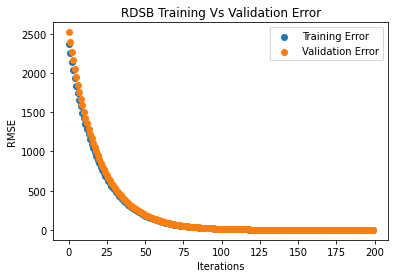

In [ ]:
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('RDSB Training Vs Validation Error')
plt.legend()
plt.show()

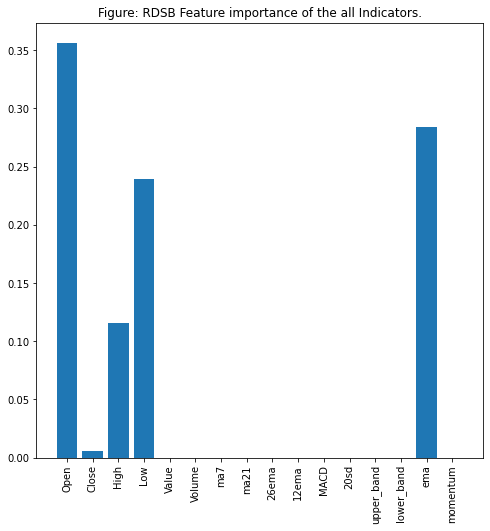

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: RDSB Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:17]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:16:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


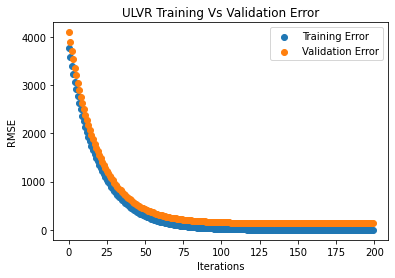

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_ULVR)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('ULVR Training Vs Validation Error')
plt.legend()
plt.show()

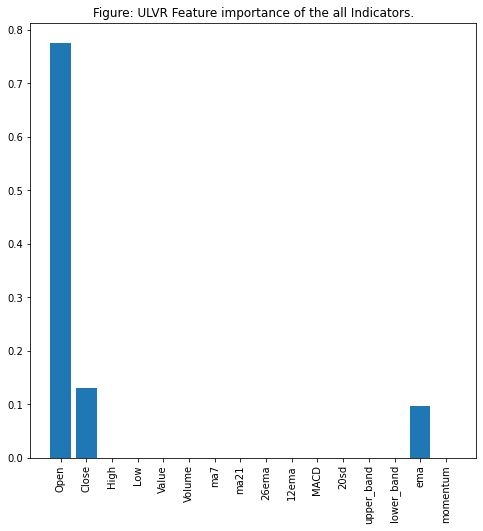

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: ULVR Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:17]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:18:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


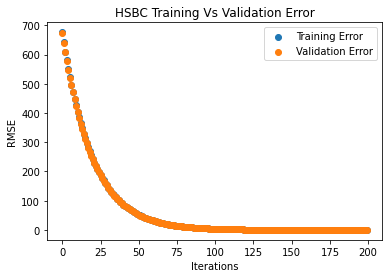

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_HSBC)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('HSBC Training Vs Validation Error')
plt.legend()
plt.show()

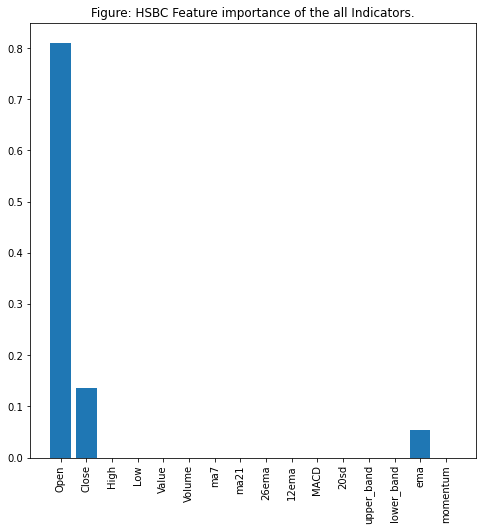

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: HSBC Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:17]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:18:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


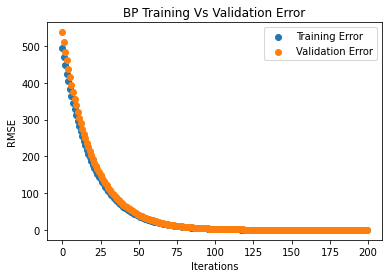

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_BP)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('BP Training Vs Validation Error')
plt.legend()
plt.show()

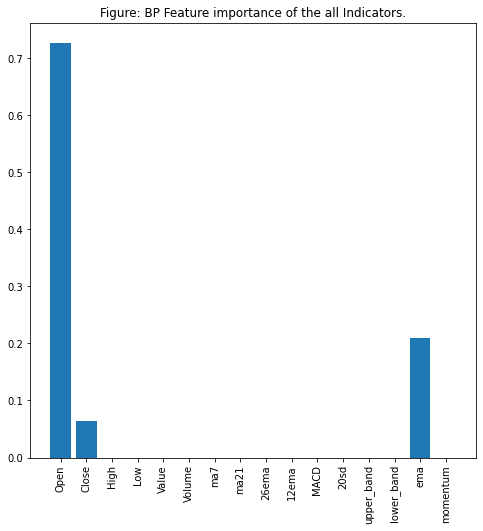

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: BP Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:19:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


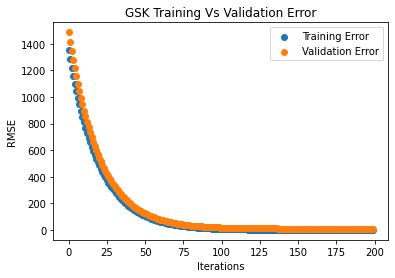

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_GSK)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('GSK Training Vs Validation Error')
plt.legend()
plt.show()

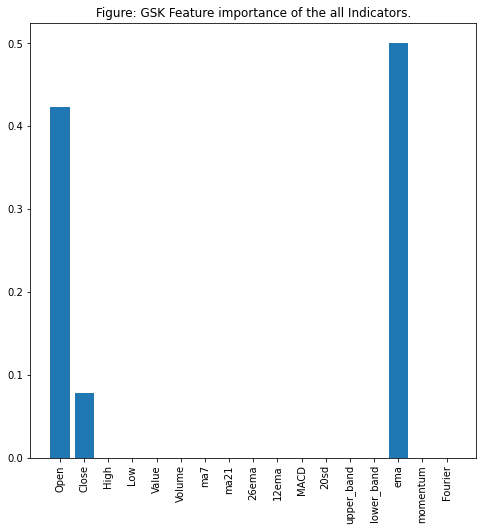

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: GSK Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:19:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


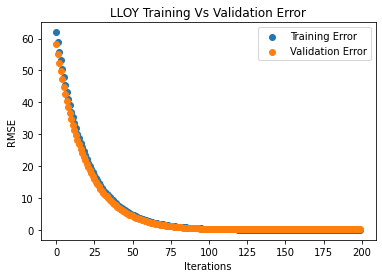

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_LLOY)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('LLOY Training Vs Validation Error')
plt.legend()
plt.show()

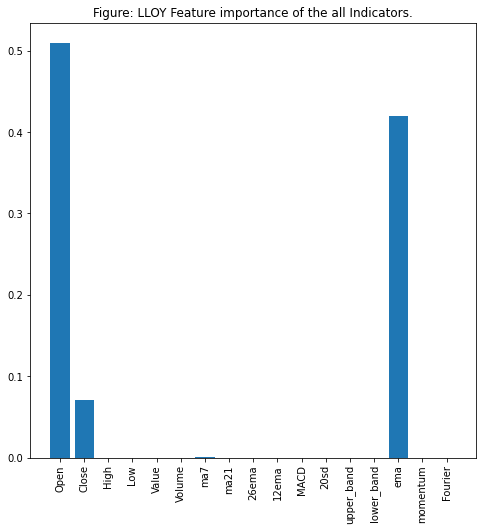

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: LLOY Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:30:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


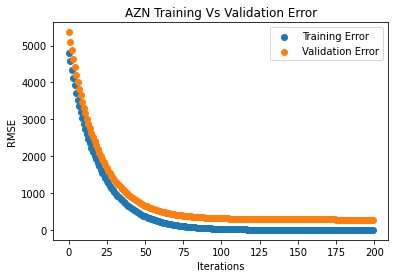

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_AZN)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('AZN Training Vs Validation Error')
plt.legend()
plt.show()

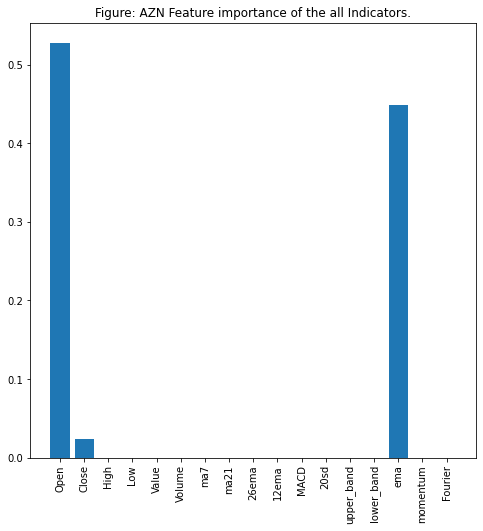

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: AZN Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:31:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


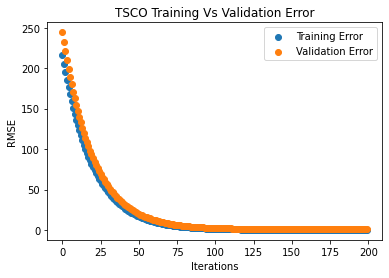

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_TSCO)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('TSCO Training Vs Validation Error')
plt.legend()
plt.show()

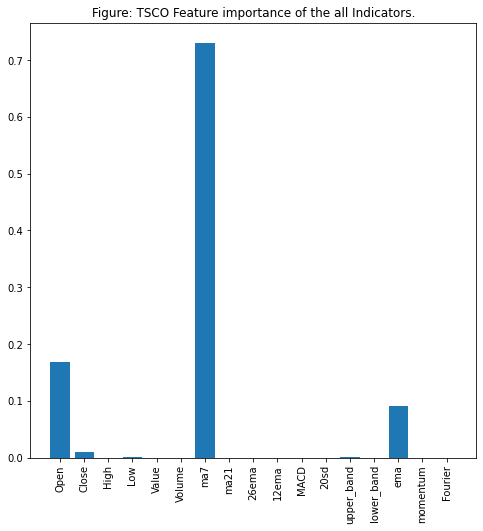

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: TSCO Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:32:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


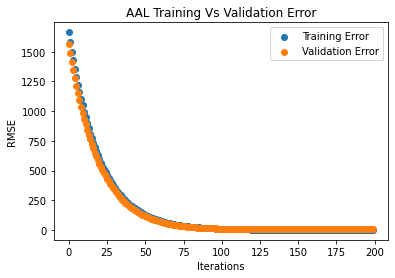

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_AAL)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('AAL Training Vs Validation Error')
plt.legend()
plt.show()

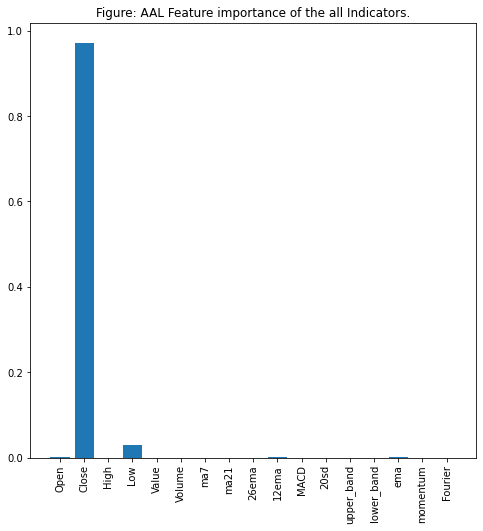

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: AAL Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[15:32:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


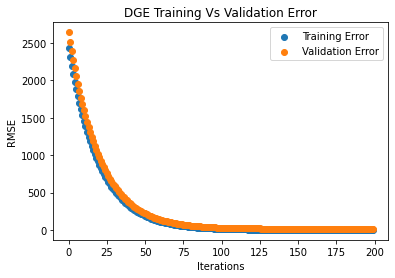

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_DGE)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('DGE Training Vs Validation Error')
plt.legend()
plt.show()

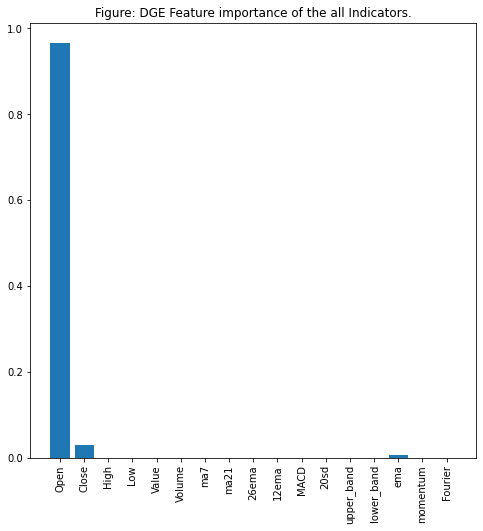

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: DGE Feature importance of the all Indicators.')
plt.show()

#Pre-Processing

*Scenario 1*

In [ ]:
#Five most significant features
dataset_S1_RDSB = dataset_ex_df_RDSB[['Dates','Open','Close','High','Low','ema']]
dataset_S1_RDSB.fillna(0, inplace=True) 
dataset_S1_RDSB.head(2)                              

,Dates,Open,Close,High,Low,ema
0,2018-02-14 08:00:00,2319.0,2315.5,2319.0,2315.5,2315.500
1,2018-02-14 08:01:00,2316.5,2314.0,2316.5,2312.5,2314.375


In [ ]:
dataset_S1_ULVR = dataset_ex_df_ULVR[['Dates','Open','Close','ema']]
print(dataset_S1_ULVR.fillna(0, inplace=True))
print(dataset_S1_ULVR.head(2))

None
                Dates    Open   Close       ema
0 2018-02-14 08:00:00  3805.0  3797.5  3797.500
1 2018-02-14 08:01:00  3801.0  3800.0  3799.375


In [ ]:
dataset_S1_HSBC = dataset_ex_df_HSBC[['Dates','Open','Close','ema']]
print(dataset_S1_HSBC.fillna(0, inplace=True))
print(dataset_S1_HSBC.head(2))

None
                Dates   Open  Close      ema
0 2018-02-14 08:00:00  751.0  749.2  749.200
1 2018-02-14 08:01:00  749.2  749.9  749.725


In [ ]:
dataset_S1_BP = dataset_ex_df_BP[['Dates','Open','Close','ema']]
print(dataset_S1_BP.fillna(0, inplace=True))
print(dataset_S1_BP.head(2))

None
                Dates    Open   Close       ema
0 2018-02-14 08:00:00  477.00  476.70  476.7000
1 2018-02-14 08:01:00  477.05  476.25  476.3625


In [ ]:
dataset_S1_GSK = dataset_ex_df_GSK[['Dates','Open','Close','ema']]
print(dataset_S1_GSK.fillna(0, inplace=True))
print(dataset_S1_GSK.head(2))

None
                Dates    Open   Close     ema
0 2018-02-14 08:01:00  1293.4  1292.8  1292.8
1 2018-02-14 08:00:00  1292.8  1288.8  1289.8


In [45]:
dataset_S1_LLOY = dataset_ex_df_LLOY[['Dates','Open','Close','ma7','ema']]
print(dataset_S1_LLOY.fillna(0, inplace=True))
print(dataset_S1_LLOY.head(2))

None
                Dates   Open  Close  ma7      ema
0 2018-02-14 08:00:00  67.00  67.07  0.0  67.0700
1 2018-02-14 08:01:00  67.17  67.16  0.0  67.1375


In [46]:
dataset_S1_AZN = dataset_ex_df_AZN[['Dates','Open','Close','ema']]
print(dataset_S1_AZN.fillna(0, inplace=True))
print(dataset_S1_AZN.head(2))

None
                 Dates    Open   Close     ema
0  2018-02-14 08:00:00  4835.5  4832.5  4832.5
1  2018-02-14 08:01:00  4832.5  4832.5  4832.5


In [47]:
dataset_S1_TSCO = dataset_ex_df_TSCO[['Dates','Open','Close','Low','ma7', 'upper_band','ema']]
print(dataset_S1_TSCO.fillna(0, inplace=True))
print(dataset_S1_TSCO.head(2))

None
                Dates   Open  Close    Low  ma7  upper_band      ema
0 2018-02-14 08:00:00  204.0  204.0  204.0  0.0         0.0  204.000
1 2018-02-14 08:01:00  204.1  204.1  204.1  0.0         0.0  204.075


In [48]:
dataset_S1_AAL = dataset_ex_df_AAL[['Dates','Open','Close','Low','12ema', 'ema']]
print(dataset_S1_AAL.fillna(0, inplace=True))
print(dataset_S1_AAL.head(2))

None
                Dates    Open   Close     Low        12ema      ema
0 2018-02-14 08:00:00  1682.0  1679.8  1677.6  1679.800000  1679.80
1 2018-02-14 08:01:00  1679.8  1680.8  1678.0  1680.341667  1680.55


In [49]:
dataset_S1_DGE = dataset_ex_df_DGE[['Dates','Close','Low','ema']]
print(dataset_S1_DGE.fillna(0, inplace=True))
print(dataset_S1_DGE.head(2))

None
                Dates   Close     Low       ema
0 2018-02-14 08:00:00  2473.0  2472.0  2473.000
1 2018-02-14 08:01:00  2474.5  2474.0  2474.125


#Optimal-Modeling Filter

**2.Optimal DRL model for ideal Buy/sell decision**


1.   Trigger2 -> TA2-> Request2 -> Layer2 -> Train Q Learning Agents and  Policy Gradient Agents
2.   Select DRL model with optimal performance metrics for lowest execution time
3.   Test optimal DRL model



*Scenario-1*

**RDSB**

In [50]:
def get_mean(df, col):
    """
    Given a dataframe, get mean and std dev at timestep t using values from t-1, t-2, ..., t-N.
    Inputs
        df         : dataframe. Can be of any length.
        col        : name of the column you want to calculate mean and std dev
        N          : get mean and std dev at timestep t using values from t-1, t-2, ..., t-N
    Outputs
        df_out     : same as df but with additional column containing mean and std dev
    """
    mean_list = df.mean(axis=1) # len(mean_list) = len(df)
     
    # Add one timestep to the predictions
    #mean_list = np.concatenate((np.array([np.nan]), np.array(mean_list[:-1])))
    #std_list = np.concatenate((np.array([np.nan]), np.array(std_list[:-1])))
    
    # Append mean_list to df
    df_out = df.copy()
    df_out[col + '_mean'] = mean_list
    #df_out[col + '_std'] = std_list
    
    return df_out

In [ ]:
df1_RDSB = dataset_S1_RDSB[['Dates','Close','High','Low','Open','ema']]
df1_RDSB.head(2)

,Dates,Close,High,Low,Open,ema
0,2018-02-14 08:00:00,2315.5,2319.0,2315.5,2319.0,2315.500
1,2018-02-14 08:01:00,2314.0,2316.5,2312.5,2316.5,2314.375


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_RDSB) + 1, 1)

In [ ]:
cols_list = [
"Close",
"Open",
"Low",
"High",
"ema"
]

for col in cols_list:
    ORDSB_avg = get_mean(df1_RDSB, col)
ORDSB_avg.head(3)

,Dates,Close,High,Low,Open,ema,ema_mean
0,2018-02-14 08:00:00,2315.5,2319.0,2315.5,2319.0,2315.500000,2316.900000
1,2018-02-14 08:01:00,2314.0,2316.5,2312.5,2316.5,2314.375000,2314.775000
2,2018-02-14 08:02:00,2306.0,2312.0,2305.0,2311.5,2308.576923,2308.615385


In [ ]:
df1_RDSB = ORDSB_avg[['Dates','High','Close','Open', 'Low', 'ema','ema_mean']]
df1_RDSB.head(3)

,Dates,High,Close,Open,Low,ema,ema_mean
0,2018-02-14 08:00:00,2319.0,2315.5,2319.0,2315.5,2315.500000,2316.900000
1,2018-02-14 08:01:00,2316.5,2314.0,2316.5,2312.5,2314.375000,2314.775000
2,2018-02-14 08:02:00,2312.0,2306.0,2311.5,2305.0,2308.576923,2308.615385


In [58]:
name = 'Policy Gradient agent'
class PGAgent:

    LEARNING_RATE = 1e-4
    LAYER_SIZE = 256
    GAMMA = 0.9
    OUTPUT_SIZE = 3

    def __init__(self, state_size, window_size, trend, skip):
        self.state_size = state_size
        self.window_size = window_size
        self.half_window = window_size // 2
        self.trend = trend
        self.skip = skip
        self.X = tf.placeholder(tf.float32, (None, self.state_size))
        self.REWARDS = tf.placeholder(tf.float32, (None))
        self.ACTIONS = tf.placeholder(tf.int32, (None))
        feed_forward = tf.layers.dense(self.X, self.LAYER_SIZE, activation = tf.nn.relu)
        self.logits = tf.layers.dense(feed_forward, self.OUTPUT_SIZE, activation = tf.nn.softmax)
        input_y = tf.one_hot(self.ACTIONS, self.OUTPUT_SIZE)
        loglike = tf.log((input_y * (input_y - self.logits) + (1 - input_y) * (input_y + self.logits)) + 1)
        rewards = tf.tile(tf.reshape(self.REWARDS, (-1,1)), [1, self.OUTPUT_SIZE])
        self.cost = -tf.reduce_mean(loglike * (rewards + 1)) 
        self.optimizer = tf.train.AdamOptimizer(learning_rate = self.LEARNING_RATE).minimize(self.cost)
        self.sess = tf.InteractiveSession()
        self.sess.run(tf.global_variables_initializer())
    
    def predict(self, inputs):
        return self.sess.run(self.logits, feed_dict={self.X:inputs})
    
    def get_state(self, t):
        window_size = self.window_size + 1
        d = t - window_size + 1
        block = self.trend[d : t + 1] if d >= 0 else -d * [self.trend[0]] + self.trend[0 : t + 1]
        res = []
        for i in range(window_size - 1):
            res.append(block[i + 1] - block[i])
        return np.array([res])
    
    def discount_rewards(self, r):
        discounted_r = np.zeros_like(r)
        running_add = 0
        for t in reversed(range(0, r.size)):
            running_add = running_add * self.GAMMA + r[t]
            discounted_r[t] = running_add
        return discounted_r
    
    def get_predicted_action(self, sequence):
        prediction = self.predict(np.array(sequence))[0]
        return np.argmax(prediction)
    
    def buy(self, initial_money):
        starting_money = initial_money
        states_sell = []
        states_buy = []
        inventory = []
        state = self.get_state(0)
        for t in range(0, len(self.trend) - 1, self.skip):
            action = self.get_predicted_action(state)
            next_state = self.get_state(t + 1)
            
            if action == 1 and initial_money >= self.trend[t] and t < (len(self.trend) - self.half_window):
                inventory.append(self.trend[t])
                initial_money -= self.trend[t]
                states_buy.append(t)
                print('mins %d: buy 1 unit at price %f, total balance %f'% (t, self.trend[t], initial_money))
                
                
            elif action == 2 and len(inventory):
                bought_price = inventory.pop(0)
                initial_money += self.trend[t]
                states_sell.append(t)
                try:
                    invest = ((close[t] - bought_price) / bought_price) * 100
                except:
                    invest = 0
                print(
                    'mins %d, sell 1 unit at price %f, investment %f %%, total balance %f,'
                    % (t, close[t], invest, initial_money)
                )
            
            state = next_state
        invest = ((initial_money - starting_money) / starting_money) * 100
        total_gains = initial_money - starting_money
        return states_buy, states_sell, total_gains, invest
        
    
    def train(self, iterations, checkpoint, initial_money):
        for i in range(iterations):
            ep_history = []
            total_profit = 0
            inventory = []
            state = self.get_state(0)
            starting_money = initial_money
            for t in range(0, len(self.trend) - 1, self.skip):
                action = self.get_predicted_action(state)
                next_state = self.get_state(t + 1)
                if action == 1 and starting_money >= self.trend[t] and t < (len(self.trend) - self.half_window):
                    inventory.append(self.trend[t])
                    starting_money -= close[t]
                
                elif action == 2 and len(inventory):
                    bought_price = inventory.pop(0)
                    total_profit += self.trend[t] - bought_price
                    starting_money += self.trend[t]
                ep_history.append([state,action,starting_money,next_state])
                state = next_state
            ep_history = np.array(ep_history)
            ep_history[:,2] = self.discount_rewards(ep_history[:,2])
            cost, _ = self.sess.run([self.cost, self.optimizer], feed_dict={self.X:np.vstack(ep_history[:,0]),
                                                    self.REWARDS:ep_history[:,2],
                                                    self.ACTIONS:ep_history[:,1]})
            if (i+1) % checkpoint == 0:
                print('epoch: %d, total rewards: %f.3, cost: %f, total money: %f'%(i + 1, total_profit, cost,
                                                                                  starting_money))

In [ ]:
close = df1_RDSB.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 320.943016.3, cost: -26644.019531, total money: 10320.943016
epoch: 20, total rewards: 317.255484.3, cost: -25849.230469, total money: 10317.255484
epoch: 30, total rewards: 286.031295.3, cost: -24419.871094, total money: 10286.031295
epoch: 40, total rewards: 434.875985.3, cost: -22238.039062, total money: 10434.875985
epoch: 50, total rewards: 482.722191.3, cost: -19482.605469, total money: 10482.722191


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 59424: buy 1 unit at price 2617.335352, total balance 5532.608996
mins 59425, sell 1 unit at price 2616.945117, investment -0.088170 %, total balance 8149.554114,
mins 59426: buy 1 unit at price 2617.215039, total balance 5532.339074
mins 59428, sell 1 unit at price 2617.679449, investment 0.013147 %, total balance 8150.018523,
mins 59429, sell 1 unit at price 2618.526483, investment 0.050108 %, total balance 10768.545006,
mins 59433: buy 1 unit at price 2619.774401, total balance 8148.770605
mins 59434, sell 1 unit at price 2620.524800, investment 0.028644 %, total balance 10769.295406,
mins 59435: buy 1 unit at price 2621.241600, total balance 8148.053805
mins 59436: buy 1 unit at price 2621.847200, total balance 5526.206605
mins 59437: buy 1 unit at price 2622.715733, total balance 2903.490872
mins 59439, sell 1 unit at price 2623.012859, investment 0.067573 %, total balance 5526.503731,
mins 59440: buy 1 unit at price 2623.804

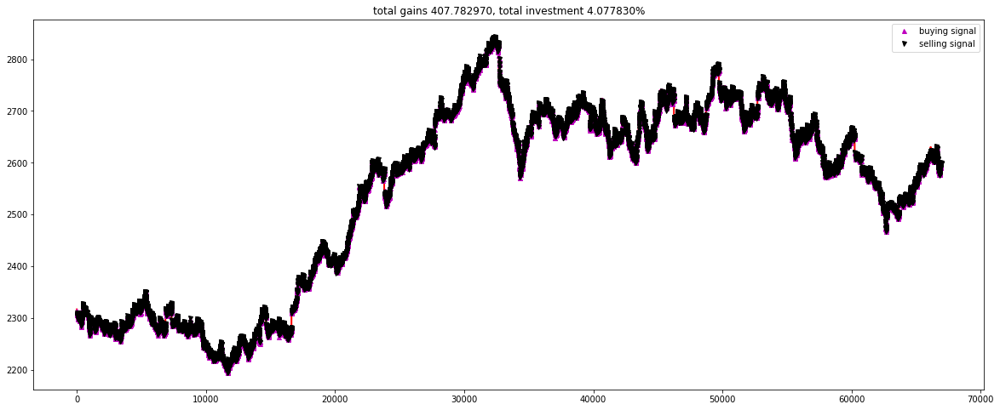

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=5, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=5, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**ULVR**

In [ ]:
df1_ULVR = dataset_S1_ULVR
df1_ULVR.head(3)

,Dates,Open,Close,ema
0,2018-02-14 08:00:00,3805.0,3797.5,3797.500000
1,2018-02-14 08:01:00,3801.0,3800.0,3799.375000
2,2018-02-14 08:02:00,3797.0,3793.0,3794.961538


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_ULVR) + 1, 1)

In [ ]:
cols_list = [
"Open",
"Close",
"ema"
]

for col in cols_list:
    OULVR_avg = get_mean(df1_ULVR, col)
OULVR_avg.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,3805.0,3797.5,3797.500000,3800.000000
1,2018-02-14 08:01:00,3801.0,3800.0,3799.375000,3800.125000
2,2018-02-14 08:02:00,3797.0,3793.0,3794.961538,3794.987179


In [ ]:
df1_ULVR = OULVR_avg
df1_ULVR.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,3805.0,3797.5,3797.500000,3800.000000
1,2018-02-14 08:01:00,3801.0,3800.0,3799.375000,3800.125000
2,2018-02-14 08:02:00,3797.0,3793.0,3794.961538,3794.987179


In [ ]:
close = df1_ULVR.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 927.579641.3, cost: -25861.482422, total money: 10927.579641
epoch: 20, total rewards: 994.082131.3, cost: -25286.314453, total money: 10994.082131
epoch: 30, total rewards: 1070.117270.3, cost: -24032.015625, total money: 11070.117270
epoch: 40, total rewards: 1222.299861.3, cost: -23054.595703, total money: 11222.299861
epoch: 50, total rewards: 1414.964727.3, cost: -22242.845703, total money: 11414.964727


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 58654: buy 1 unit at price 4340.014213, total balance 2765.130773
mins 58656, sell 1 unit at price 4340.297875, investment -0.001978 %, total balance 7105.428648,
mins 58658, sell 1 unit at price 4337.273838, investment -0.063142 %, total balance 11442.702486,
mins 58660: buy 1 unit at price 4337.604501, total balance 7105.097986
mins 58661: buy 1 unit at price 4338.423722, total balance 2766.674263
mins 58662, sell 1 unit at price 4336.974574, investment -0.014522 %, total balance 7103.648837,
mins 58663: buy 1 unit at price 4337.324858, total balance 2766.323979
mins 58664, sell 1 unit at price 4335.663842, investment -0.063615 %, total balance 7101.987821,
mins 58665: buy 1 unit at price 4334.610169, total balance 2767.377652
mins 58670, sell 1 unit at price 4335.474390, investment -0.042664 %, total balance 7102.852042,
mins 58671: buy 1 unit at price 4335.935908, total balance 2766.916134
mins 58675, sell 1 unit at price 4337

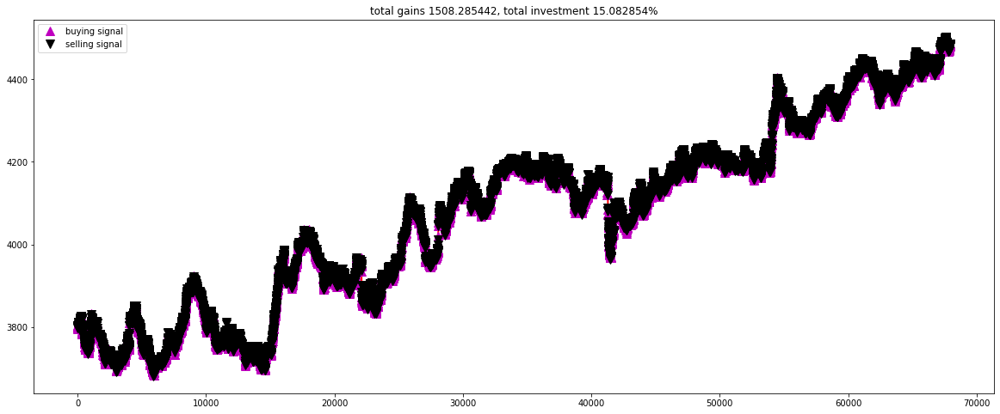

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**HSBC**

In [ ]:
df1_HSBC = dataset_S1_HSBC
df1_HSBC.head(3)

,Dates,Open,Close,ema
0,2018-02-14 08:00:00,751.0,749.2,749.200000
1,2018-02-14 08:01:00,749.2,749.9,749.725000
2,2018-02-14 08:02:00,749.7,749.8,749.776923


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_HSBC) + 1, 1)

In [ ]:
cols_list = [
"Open",
"Close",
"ema"
]

for col in cols_list:
    OHSBC_avg = get_mean(df1_HSBC, col)
OHSBC_avg.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,751.0,749.2,749.200000,749.800000
1,2018-02-14 08:01:00,749.2,749.9,749.725000,749.608333
2,2018-02-14 08:02:00,749.7,749.8,749.776923,749.758974


In [ ]:
df1_HSBC = OHSBC_avg
df1_HSBC.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,751.0,749.2,749.200000,749.800000
1,2018-02-14 08:01:00,749.2,749.9,749.725000,749.608333
2,2018-02-14 08:02:00,749.7,749.8,749.776923,749.758974


In [ ]:
close = df1_HSBC.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -117.532510.3, cost: -5910.347168, total money: 3676.625165
epoch: 20, total rewards: -296.364125.3, cost: -8226.001953, total money: 4876.851510
epoch: 30, total rewards: -579.821009.3, cost: -6739.818848, total money: 4593.279590
epoch: 40, total rewards: -527.891926.3, cost: -5768.995605, total money: 3955.763448
epoch: 50, total rewards: -629.599314.3, cost: -6397.748047, total money: 4543.616310


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 59118: buy 1 unit at price 701.908749, total balance 207.203763
mins 59120, sell 1 unit at price 702.038009, investment -0.164820 %, total balance 909.241772,
mins 59123, sell 1 unit at price 701.427334, investment -0.212615 %, total balance 1610.669106,
mins 59124, sell 1 unit at price 701.442445, investment -0.113014 %, total balance 2312.111551,
mins 59126, sell 1 unit at price 701.697309, investment -0.130040 %, total balance 3013.808859,
mins 59127: buy 1 unit at price 701.965770, total balance 2311.843090
mins 59128: buy 1 unit at price 701.910812, total balance 1609.932278
mins 59130: buy 1 unit at price 701.567868, total balance 908.364410
mins 59131: buy 1 unit at price 701.522623, total balance 206.841787
mins 59139, sell 1 unit at price 701.710322, investment -0.111350 %, total balance 908.552109,
mins 59140: buy 1 unit at price 701.758996, total balance 206.793113
mins 59141, sell 1 unit at price 701.686332, investment

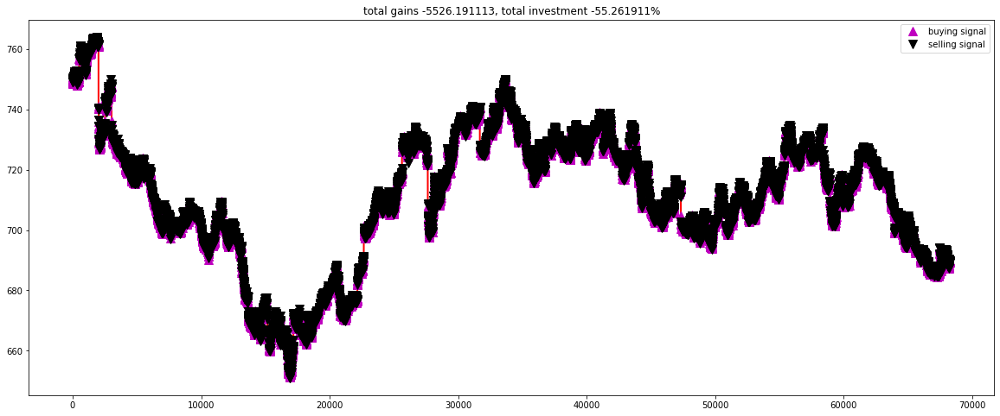

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

In [ ]:
df1_BP = dataset_S1_BP
df1_BP.head(3)

,Dates,Open,Close,ema
0,2018-02-14 08:00:00,477.00,476.70,476.700000
1,2018-02-14 08:01:00,477.05,476.25,476.362500
2,2018-02-14 08:02:00,476.05,475.00,475.419231


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_BP) + 1, 1)

In [ ]:
cols_list = [
"Open",
"Close",
"ema"
]

for col in cols_list:
    OBP_avg = get_mean(df1_BP, col)
OBP_avg.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,477.00,476.70,476.700000,476.800000
1,2018-02-14 08:01:00,477.05,476.25,476.362500,476.554167
2,2018-02-14 08:02:00,476.05,475.00,475.419231,475.489744


In [ ]:
df1_BP = OBP_avg
df1_BP.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,477.00,476.70,476.700000,476.800000
1,2018-02-14 08:01:00,477.05,476.25,476.362500,476.554167
2,2018-02-14 08:02:00,476.05,475.00,475.419231,475.489744


In [ ]:
close = df1_BP.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 483.349033.3, cost: -7375.524902, total money: 1567.791333
epoch: 20, total rewards: 584.706704.3, cost: -5871.630859, total money: 1667.115246
epoch: 30, total rewards: 648.164152.3, cost: -5369.082031, total money: 1173.571063
epoch: 40, total rewards: 694.606989.3, cost: -5814.704590, total money: 2890.367582
epoch: 50, total rewards: 759.777269.3, cost: -6570.286621, total money: 4070.278580


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 59480, sell 1 unit at price 553.424991, investment -0.448694 %, total balance 3100.758980,
mins 59481, sell 1 unit at price 553.163886, investment -0.422219 %, total balance 3653.922866,
mins 59482: buy 1 unit at price 552.999073, total balance 3100.923793
mins 59483: buy 1 unit at price 553.077469, total balance 2547.846324
mins 59484: buy 1 unit at price 553.303601, total balance 1994.542723
mins 59485: buy 1 unit at price 553.390089, total balance 1441.152634
mins 59486: buy 1 unit at price 553.252252, total balance 887.900382
mins 59487: buy 1 unit at price 553.317417, total balance 334.582965
mins 59490, sell 1 unit at price 553.542620, investment -0.357519 %, total balance 888.125585,
mins 59491, sell 1 unit at price 553.236429, investment -0.361371 %, total balance 1441.362014,
mins 59492: buy 1 unit at price 553.134365, total balance 888.227649
mins 59494: buy 1 unit at price 553.485300, total balance 334.742349
mins 59497

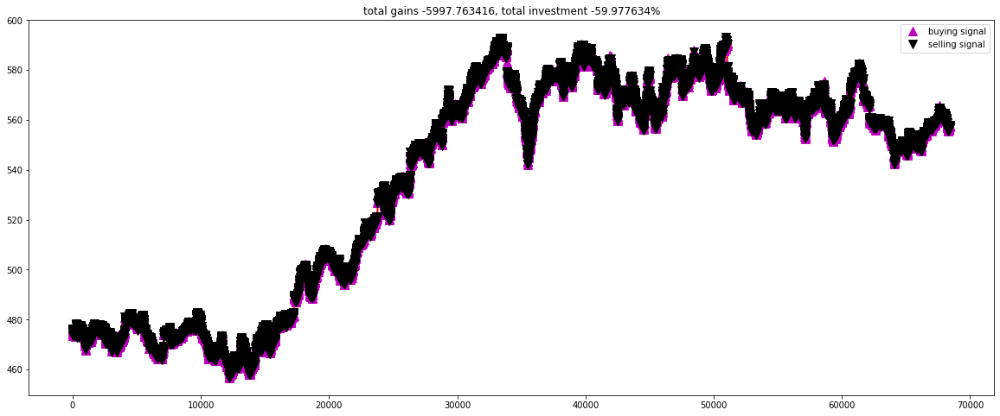

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

In [ ]:
df1_GSK = dataset_S1_GSK
df1_GSK.head()

,Dates,Open,Close,ema
0,2018-02-14 08:01:00,1293.4,1292.8,1292.800000
1,2018-02-14 08:00:00,1292.8,1288.8,1289.800000
2,2018-02-14 08:02:00,1288.2,1286.4,1287.446154
3,2018-02-14 08:03:00,1287.0,1287.8,1287.685000
4,2018-02-14 08:04:00,1289.0,1287.4,1287.494215


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_GSK) + 1, 1)

In [ ]:
cols_list = [
"Open",
"Close",
"ema"
]

for col in cols_list:
    OGSK_avg = get_mean(df1_GSK, col)
OGSK_avg.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:01:00,1293.4,1292.8,1292.800000,1293.000000
1,2018-02-14 08:00:00,1292.8,1288.8,1289.800000,1290.466667
2,2018-02-14 08:02:00,1288.2,1286.4,1287.446154,1287.348718


In [ ]:
df1_GSK = OGSK_avg
df1_GSK.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:01:00,1293.4,1292.8,1292.800000,1293.000000
1,2018-02-14 08:00:00,1292.8,1288.8,1289.800000,1290.466667
2,2018-02-14 08:02:00,1288.2,1286.4,1287.446154,1287.348718


In [ ]:
close = df1_GSK.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 1272.769199.3, cost: -3762.897217, total money: 6468.658055
epoch: 20, total rewards: 993.739555.3, cost: -5376.911133, total money: 7790.967871
epoch: 30, total rewards: 761.266469.3, cost: -7243.525391, total money: 9160.022633
epoch: 40, total rewards: 669.585482.3, cost: -9580.221680, total money: 7466.949258
epoch: 50, total rewards: 738.936352.3, cost: -10764.561523, total money: 9137.593424


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 57132: buy 1 unit at price 1567.847896, total balance 2957.574620
mins 57133: buy 1 unit at price 1568.549299, total balance 1389.025321
mins 57145, sell 1 unit at price 1569.182594, investment 0.436911 %, total balance 2958.207915,
mins 57148: buy 1 unit at price 1568.387010, total balance 1389.820906
mins 57151, sell 1 unit at price 1568.824210, investment 0.280806 %, total balance 2958.645116,
mins 57152, sell 1 unit at price 1569.496959, investment 0.296393 %, total balance 4528.142075,
mins 57153, sell 1 unit at price 1569.921209, investment 0.198547 %, total balance 6098.063284,
mins 57154: buy 1 unit at price 1570.218181, total balance 4527.845103
mins 57155: buy 1 unit at price 1571.050505, total balance 2956.794598
mins 57157: buy 1 unit at price 1572.353760, total balance 1384.440838
mins 57160, sell 1 unit at price 1570.660016, investment 0.179362 %, total balance 2955.100854,
mins 57161, sell 1 unit at price 1570.37556

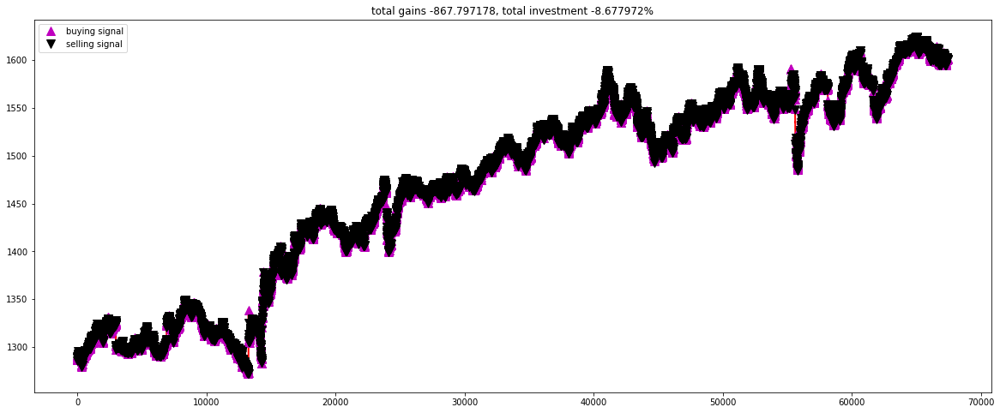

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**LLOY**

In [53]:
df1_LLOY = dataset_S1_LLOY.drop(['ma7'],axis=1)
df1_LLOY.head(3)

,Dates,Open,Close,ema
0,2018-02-14 08:00:00,67.00,67.07,67.070000
1,2018-02-14 08:01:00,67.17,67.16,67.137500
2,2018-02-14 08:02:00,67.10,66.98,67.028462


In [54]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_LLOY) + 1, 1)

In [55]:
cols_list = [
"Open",
"Close",
"ema"
]

for col in cols_list:
    OLLOY_avg = get_mean(df1_LLOY, col)
OLLOY_avg.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,67.00,67.07,67.070000,67.046667
1,2018-02-14 08:01:00,67.17,67.16,67.137500,67.155833
2,2018-02-14 08:02:00,67.10,66.98,67.028462,67.036154


In [56]:
df1_LLOY = OLLOY_avg
df1_LLOY.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,67.00,67.07,67.070000,67.046667
1,2018-02-14 08:01:00,67.17,67.16,67.137500,67.155833
2,2018-02-14 08:02:00,67.10,66.98,67.028462,67.036154


In [59]:
close = df1_LLOY.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
epoch: 10, total rewards: -851.109844.3, cost: -3710.825439, total money: 6504.018991
epoch: 20, total rewards: -890.685040.3, cost: -1003.570618, total money: 1494.588041
epoch: 30, total rewards: -897.749902.3, cost: -1642.672974, total money: 2463.611587
epoch: 40, total rewards: -916.794710.3, cost: -1658.892578, total money: 1285.906991
epoch: 50, total rewards: -970.794369.3, cost: -2034.417603, total money: 1227.832252


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 34833, sell 1 unit at price 65.234343, investment -2.586138 %, total balance 291.455782,
mins 34834: buy 1 unit at price 65.233670, total balance 226.222112
mins 34835: buy 1 unit at price 65.226779, total balance 160.995334
mins 34836: buy 1 unit at price 65.230037, total balance 95.765296
mins 34837: buy 1 unit at price 65.242235, total balance 30.523061
mins 34844, sell 1 unit at price 65.113971, investment -2.914740 %, total balance 95.637033,
mins 34845: buy 1 unit at price 65.106879, total balance 30.530154
mins 34846, sell 1 unit at price 65.074515, investment -3.138420 %, total balance 95.604669,
mins 34852: buy 1 unit at price 65.076037, total balance 30.528632
mins 34894, sell 1 unit at price 64.556649, investment -3.986581 %, total balance 95.085281,
mins 34898, sell 1 unit at price 64.465062, investment -4.343654 %, total balance 159.550342,
mins 34900: buy 1 unit at price 64.440192, total balance 95.110150
mins 34901:

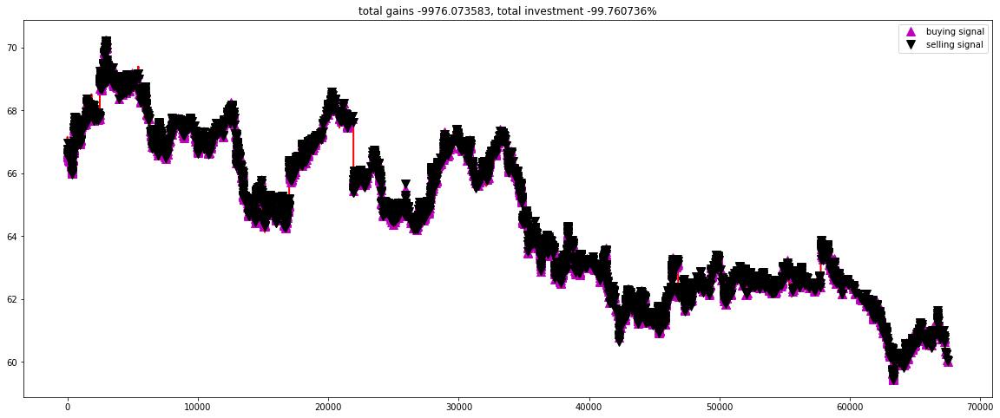

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**AZN**

In [60]:
df1_AZN = dataset_S1_AZN
df1_AZN.head(3)

,Dates,Open,Close,ema
0,2018-02-14 08:00:00,4835.5,4832.5,4832.500000
1,2018-02-14 08:01:00,4832.5,4832.5,4832.500000
2,2018-02-14 08:02:00,4834.5,4830.0,4830.769231


In [61]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_AZN) + 1, 1)

In [62]:
cols_list = [
"Open",
"Close",
"ema"
]

for col in cols_list:
    OAZN_avg = get_mean(df1_AZN, col)
OAZN_avg.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,4835.5,4832.5,4832.500000,4833.50000
1,2018-02-14 08:01:00,4832.5,4832.5,4832.500000,4832.50000
2,2018-02-14 08:02:00,4834.5,4830.0,4830.769231,4831.75641


In [63]:
df1_AZN = OAZN_avg
df1_AZN.head(3)

,Dates,Open,Close,ema,ema_mean
0,2018-02-14 08:00:00,4835.5,4832.5,4832.500000,4833.50000
1,2018-02-14 08:01:00,4832.5,4832.5,4832.500000,4832.50000
2,2018-02-14 08:02:00,4834.5,4830.0,4830.769231,4831.75641


In [ ]:
close = df1_AZN.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 658.816092.3, cost: -21899.966797, total money: 10658.816092
epoch: 20, total rewards: 643.444472.3, cost: -21418.736328, total money: 10643.444472
epoch: 30, total rewards: 954.598126.3, cost: -20794.349609, total money: 10954.598126
epoch: 40, total rewards: 829.120952.3, cost: -20492.087891, total money: 10829.120952
epoch: 50, total rewards: 576.584106.3, cost: -19846.474609, total money: 10576.584106


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 48646, sell 1 unit at price 5225.002962, investment -0.006493 %, total balance 10217.764915,
mins 48656: buy 1 unit at price 5226.521262, total balance 4991.243653
mins 48658, sell 1 unit at price 5225.131992, investment -0.026581 %, total balance 10216.375645,
mins 48662: buy 1 unit at price 5225.026321, total balance 4991.349325
mins 48667, sell 1 unit at price 5226.961700, investment 0.037041 %, total balance 10218.311024,
mins 48670: buy 1 unit at price 5227.072656, total balance 4991.238369
mins 48671, sell 1 unit at price 5227.913107, investment 0.016079 %, total balance 10219.151476,
mins 48674: buy 1 unit at price 5228.219004, total balance 4990.932472
mins 48676, sell 1 unit at price 5226.579889, investment -0.031351 %, total balance 10217.512361,
mins 48680: buy 1 unit at price 5225.953661, total balance 4991.558700
mins 48681, sell 1 unit at price 5226.873443, investment 0.017600 %, total balance 10218.432143,
mins 4868

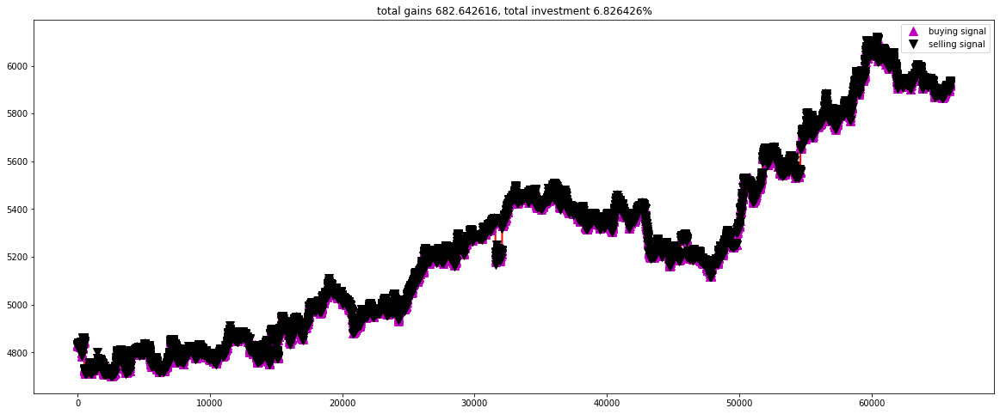

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**TSCO**

In [64]:
df1_TSCO = dataset_S1_TSCO.drop(['ma7','upper_band'],axis=1)
df1_TSCO.head(3)

,Dates,Open,Close,Low,ema
0,2018-02-14 08:00:00,204.0,204.0,204.0,204.000000
1,2018-02-14 08:01:00,204.1,204.1,204.1,204.075000
2,2018-02-14 08:02:00,204.2,204.1,203.9,204.092308


In [65]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_TSCO) + 1, 1)

In [66]:
cols_list = [
"Open",
"Close",
"Low",
"ema",
]

for col in cols_list:
    OTSCO_avg = get_mean(df1_TSCO, col)
OTSCO_avg.head(3)

,Dates,Open,Close,Low,ema,ema_mean
0,2018-02-14 08:00:00,204.0,204.0,204.0,204.000000,204.000000
1,2018-02-14 08:01:00,204.1,204.1,204.1,204.075000,204.093750
2,2018-02-14 08:02:00,204.2,204.1,203.9,204.092308,204.073077


In [67]:
df1_TSCO= OTSCO_avg
df1_TSCO.head(3)

,Dates,Open,Close,Low,ema,ema_mean
0,2018-02-14 08:00:00,204.0,204.0,204.0,204.000000,204.000000
1,2018-02-14 08:01:00,204.1,204.1,204.1,204.075000,204.093750
2,2018-02-14 08:02:00,204.2,204.1,203.9,204.092308,204.073077


In [ ]:
close = df1_TSCO.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 336.892283.3, cost: -34586.417969, total money: 10336.892283
epoch: 20, total rewards: 2346.189088.3, cost: -6547.399414, total money: 4769.982433
epoch: 30, total rewards: 2303.269090.3, cost: -2215.765137, total money: 2959.654445
epoch: 40, total rewards: 2325.847176.3, cost: -1897.291138, total money: 2476.594545
epoch: 50, total rewards: 2329.433252.3, cost: -1832.210815, total money: 2480.635985


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 46969, sell 1 unit at price 257.800076, investment 0.321045 %, total balance 439.303832,
mins 46970: buy 1 unit at price 257.800025, total balance 181.503807
mins 46977, sell 1 unit at price 257.991564, investment 0.311614 %, total balance 439.495371,
mins 46979: buy 1 unit at price 258.004618, total balance 181.490753
mins 46980, sell 1 unit at price 258.001539, investment 0.402171 %, total balance 439.492292,
mins 46981: buy 1 unit at price 258.042180, total balance 181.450112
mins 46983, sell 1 unit at price 258.026909, investment 0.288600 %, total balance 439.477021,
mins 46985: buy 1 unit at price 258.000212, total balance 181.476809
mins 46989, sell 1 unit at price 258.002472, investment 0.199533 %, total balance 439.479281,
mins 46990, sell 1 unit at price 258.000824, investment 0.268536 %, total balance 697.480105,
mins 46991: buy 1 unit at price 258.041941, total balance 439.438163
mins 46993: buy 1 unit at price 258.0491

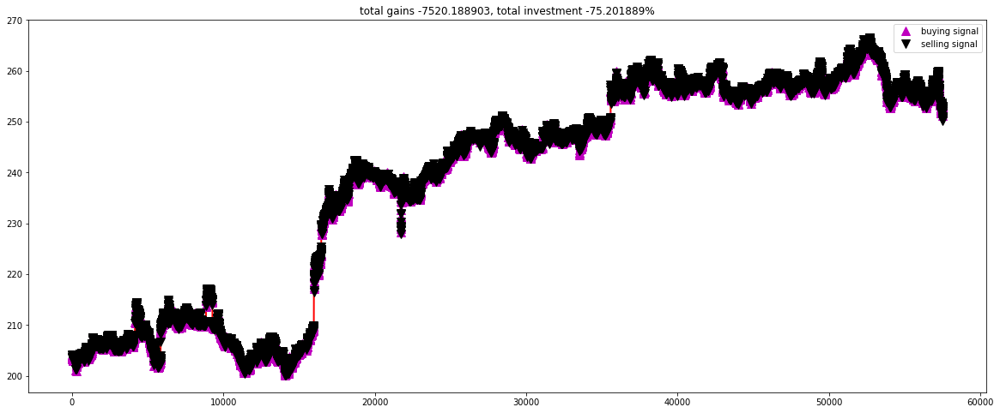

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**AAL**

In [68]:
df1_AAL = dataset_S1_AAL
df1_AAL.head(3)

,Dates,Open,Close,Low,12ema,ema
0,2018-02-14 08:00:00,1682.0,1679.8,1677.6,1679.800000,1679.800000
1,2018-02-14 08:01:00,1679.8,1680.8,1678.0,1680.341667,1680.550000
2,2018-02-14 08:02:00,1681.2,1679.0,1678.0,1679.818014,1679.476923


In [69]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_AAL) + 1, 1)

In [70]:
cols_list = [
"Open",
"Close",
"Low",
"12ema",
"ema"
]

for col in cols_list:
    OAAL_avg = get_mean(df1_AAL, col)
OAAL_avg.head(3)

,Dates,Open,Close,Low,12ema,ema,ema_mean
0,2018-02-14 08:00:00,1682.0,1679.8,1677.6,1679.800000,1679.800000,1679.800000
1,2018-02-14 08:01:00,1679.8,1680.8,1678.0,1680.341667,1680.550000,1679.898333
2,2018-02-14 08:02:00,1681.2,1679.0,1678.0,1679.818014,1679.476923,1679.498987


In [71]:
df1_AAL = OAAL_avg
df1_AAL.head(3)

,Dates,Open,Close,Low,12ema,ema,ema_mean
0,2018-02-14 08:00:00,1682.0,1679.8,1677.6,1679.800000,1679.800000,1679.800000
1,2018-02-14 08:01:00,1679.8,1680.8,1678.0,1680.341667,1680.550000,1679.898333
2,2018-02-14 08:02:00,1681.2,1679.0,1678.0,1679.818014,1679.476923,1679.498987


In [ ]:
close = df1_AAL.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -1199.474859.3, cost: -28028.726562, total money: 8800.525141
epoch: 20, total rewards: -1710.652210.3, cost: -27489.781250, total money: 8289.347790
epoch: 30, total rewards: -2374.579817.3, cost: -26282.816406, total money: 7625.420183
epoch: 40, total rewards: -2866.755190.3, cost: -24723.537109, total money: 7133.244810
epoch: 50, total rewards: -3685.766273.3, cost: -21442.494141, total money: 6314.233727


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 56387, sell 1 unit at price 1682.067200, investment 0.144029 %, total balance 7235.062924,
mins 56394: buy 1 unit at price 1682.768694, total balance 5552.294230
mins 56395, sell 1 unit at price 1682.619406, investment -0.008872 %, total balance 7234.913637,
mins 56400: buy 1 unit at price 1683.772898, total balance 5551.140739
mins 56401, sell 1 unit at price 1684.123464, investment 0.020820 %, total balance 7235.264202,
mins 56404: buy 1 unit at price 1685.087332, total balance 5550.176870
mins 56405: buy 1 unit at price 1685.701003, total balance 3864.475867
mins 56406, sell 1 unit at price 1685.855525, investment 0.045588 %, total balance 5550.331392,
mins 56409, sell 1 unit at price 1686.204626, investment 0.029876 %, total balance 7236.536019,
mins 56410: buy 1 unit at price 1686.018018, total balance 5550.518001
mins 56411, sell 1 unit at price 1685.539947, investment -0.028355 %, total balance 7236.057948,
mins 56415: buy 

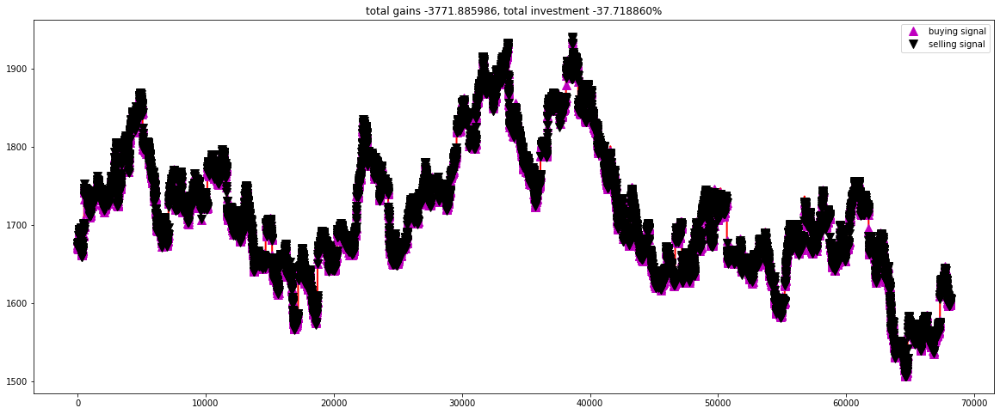

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**DGE**

In [72]:
df1_DGE = dataset_S1_DGE
df1_DGE.head(3)

,Dates,Close,Low,ema
0,2018-02-14 08:00:00,2473.0,2472.0,2473.000000
1,2018-02-14 08:01:00,2474.5,2474.0,2474.125000
2,2018-02-14 08:02:00,2475.0,2475.0,2474.730769


In [73]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_DGE) + 1, 1)

In [74]:
cols_list = [
"Close",
"Open",
"ema"
]

for col in cols_list:
    ODGE_avg = get_mean(df1_DGE, col)
ODGE_avg.head(3)

,Dates,Close,Low,ema,ema_mean
0,2018-02-14 08:00:00,2473.0,2472.0,2473.000000,2472.666667
1,2018-02-14 08:01:00,2474.5,2474.0,2474.125000,2474.208333
2,2018-02-14 08:02:00,2475.0,2475.0,2474.730769,2474.910256


In [75]:
df1_DGE = ODGE_avg
df1_DGE.head(3)

,Dates,Close,Low,ema,ema_mean
0,2018-02-14 08:00:00,2473.0,2472.0,2473.000000,2472.666667
1,2018-02-14 08:01:00,2474.5,2474.0,2474.125000,2474.208333
2,2018-02-14 08:02:00,2475.0,2475.0,2474.730769,2474.910256


In [ ]:
close = df1_DGE.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
agent = PGAgent(state_size = window_size,
             window_size = window_size,
             trend = close,
             skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 1695.546925.3, cost: -18486.755859, total money: 11695.546925
epoch: 20, total rewards: 1387.446795.3, cost: -15328.053711, total money: 11387.446795
epoch: 30, total rewards: 913.057223.3, cost: -15208.040039, total money: 10913.057223
epoch: 40, total rewards: 799.412997.3, cost: -15347.131836, total money: 10799.412997
epoch: 50, total rewards: 733.026585.3, cost: -15967.450195, total money: 10733.026585


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

Streaming output truncated to the last 5000 lines.
mins 55253, sell 1 unit at price 2835.017137, investment -0.001209 %, total balance 10838.949720,
mins 55257: buy 1 unit at price 2830.784162, total balance 8008.165558
mins 55258, sell 1 unit at price 2830.094721, investment -0.024355 %, total balance 10838.260279,
mins 55262: buy 1 unit at price 2832.303639, total balance 8005.956640
mins 55263: buy 1 unit at price 2832.323435, total balance 5173.633205
mins 55268, sell 1 unit at price 2831.642620, investment -0.023339 %, total balance 8005.275826,
mins 55269, sell 1 unit at price 2831.103096, investment -0.043086 %, total balance 10836.378921,
mins 55272: buy 1 unit at price 2830.874189, total balance 8005.504733
mins 55273: buy 1 unit at price 2831.013618, total balance 5174.491114
mins 55275, sell 1 unit at price 2830.353365, investment -0.018398 %, total balance 8004.844479,
mins 55277, sell 1 unit at price 2829.687411, investment -0.046846 %, total balance 10834.531890,
mins 552

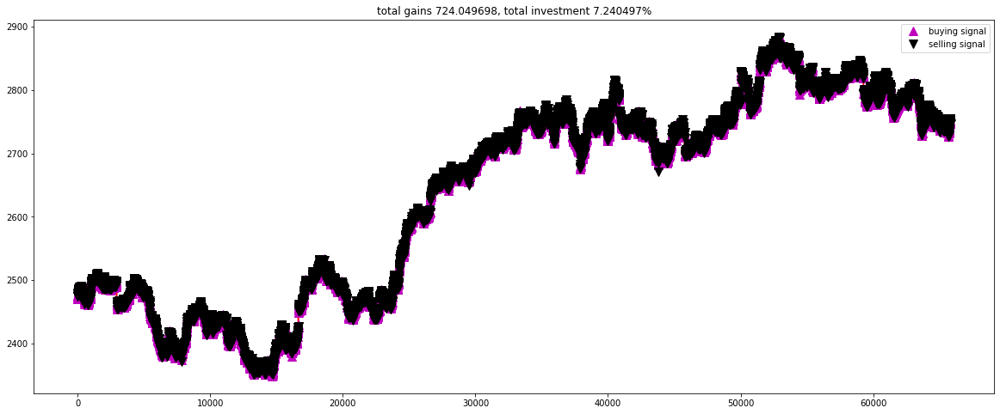

In [ ]:
fig = plt.figure(figsize = (20,8))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

#Q-Learning

In [76]:
from collections import deque
import random

name = 'Q-learning agent'

class QAgent:
    def __init__(self, state_size, window_size, trend, skip, batch_size):
        self.state_size = state_size
        self.window_size = window_size
        self.half_window = window_size // 2
        self.trend = trend
        self.skip = skip
        self.action_size = 3
        self.batch_size = batch_size
        self.memory = deque(maxlen = 1000)
        self.inventory = []

        self.gamma = 0.95
        self.epsilon = 0.5
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.999

        tf.reset_default_graph()
        self.sess = tf.InteractiveSession()
        self.X = tf.placeholder(tf.float32, [None, self.state_size])
        self.Y = tf.placeholder(tf.float32, [None, self.action_size])
        feed = tf.layers.dense(self.X, 256, activation = tf.nn.relu)
        self.logits = tf.layers.dense(feed, self.action_size)
        self.cost = tf.reduce_mean(tf.square(self.Y - self.logits))
        self.optimizer = tf.train.GradientDescentOptimizer(1e-5).minimize(
            self.cost
        )
        self.sess.run(tf.global_variables_initializer())

    def act(self, state):
        if random.random() <= self.epsilon:
            return random.randrange(self.action_size)
        return np.argmax(
            self.sess.run(self.logits, feed_dict = {self.X: state})[0]
        )
    
    def get_state(self, t):
        window_size = self.window_size + 1
        d = t - window_size + 1
        block = self.trend[d : t + 1] if d >= 0 else -d * [self.trend[0]] + self.trend[0 : t + 1]
        res = []
        for i in range(window_size - 1):
            res.append(block[i + 1] - block[i])
        return np.array([res])

    def replay(self, batch_size):
        mini_batch = []
        l = len(self.memory)
        for i in range(l - batch_size, l):
            mini_batch.append(self.memory[i])
        replay_size = len(mini_batch)
        X = np.empty((replay_size, self.state_size))
        Y = np.empty((replay_size, self.action_size))
        states = np.array([a[0][0] for a in mini_batch])
        new_states = np.array([a[3][0] for a in mini_batch])
        Q = self.sess.run(self.logits, feed_dict = {self.X: states})
        Q_new = self.sess.run(self.logits, feed_dict = {self.X: new_states})
        for i in range(len(mini_batch)):
            state, action, reward, next_state, done = mini_batch[i]
            target = Q[i]
            target[action] = reward
            if not done:
                target[action] += self.gamma * np.amax(Q_new[i])
            X[i] = state
            Y[i] = target
        cost, _ = self.sess.run(
            [self.cost, self.optimizer], feed_dict = {self.X: X, self.Y: Y}
        )
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
        return cost
    
    def buy(self, initial_money):
        starting_money = initial_money
        states_sell = []
        states_buy = []
        inventory = []
        state = self.get_state(0)
        for t in range(0, len(self.trend) - 1, self.skip):
            action = self.act(state)
            next_state = self.get_state(t + 1)
            
            if action == 1 and initial_money >= self.trend[t] and t < (len(self.trend) - self.half_window):
                inventory.append(self.trend[t])
                initial_money -= self.trend[t]
                states_buy.append(t)
                print('mins %d: buy 1 unit at price %f, total balance %f'% (t, self.trend[t], initial_money))
                
                
            elif action == 2 and len(inventory):
                bought_price = inventory.pop(0)
                initial_money += self.trend[t]
                states_sell.append(t)
                try:
                    invest = ((close[t] - bought_price) / bought_price) * 100
                except:
                    invest = 0
                print(
                    'mins %d, sell 1 unit at price %f, investment %f %%, total balance %f,'
                    % (t, close[t], invest, initial_money)
                )
            
            state = next_state
        invest = ((initial_money - starting_money) / starting_money) * 100
        total_gains = initial_money - starting_money
        return states_buy, states_sell, total_gains, invest
        
    def train(self, iterations, checkpoint, initial_money):
        for i in range(iterations):
            total_profit = 0
            inventory = []
            state = self.get_state(0)
            starting_money = initial_money
            for t in range(0, len(self.trend) - 1, self.skip):
                action = self.act(state)
                next_state = self.get_state(t + 1)
                
                if action == 1 and starting_money >= self.trend[t] and t < (len(self.trend) - self.half_window):
                    inventory.append(self.trend[t])
                    starting_money -= self.trend[t]
                
                elif action == 2 and len(inventory) > 0:
                    bought_price = inventory.pop(0)
                    total_profit += self.trend[t] - bought_price
                    starting_money += self.trend[t]
                    
                invest = ((starting_money - initial_money) / initial_money)
                self.memory.append((state, action, invest, 
                                    next_state, starting_money < initial_money))
                state = next_state
                batch_size = min(self.batch_size, len(self.memory))
                cost = self.replay(batch_size)
            if (i+1) % checkpoint == 0:
                print('epoch: %d, total rewards: %f.3, cost: %f, total money: %f'%(i + 1, total_profit, cost,
                                                                                  starting_money))

**RDSB**

In [ ]:
close = df1_RDSB.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -21.026230.3, cost: 0.002993, total money: 9978.973770
epoch: 20, total rewards: -15.067667.3, cost: 0.002635, total money: 9984.932333
epoch: 30, total rewards: 28.647489.3, cost: 0.002353, total money: 10028.647489
epoch: 40, total rewards: 13.354149.3, cost: 0.001884, total money: 10013.354149
epoch: 50, total rewards: 40.963786.3, cost: 0.001851, total money: 10040.963786


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 213: buy 1 unit at price 2303.024630, total balance 7696.975370
mins 219, sell 1 unit at price 2304.561488, investment 0.066732 %, total balance 10001.536858,
mins 247: buy 1 unit at price 2307.766900, total balance 7693.769958
mins 248, sell 1 unit at price 2306.988967, investment -0.033709 %, total balance 10000.758925,
mins 363: buy 1 unit at price 2301.329054, total balance 7699.429871
mins 364, sell 1 unit at price 2302.076351, investment 0.032472 %, total balance 10001.506222,
mins 394: buy 1 unit at price 2303.300892, total balance 7698.205330
mins 398, sell 1 unit at price 2303.491369, investment 0.008270 %, total balance 10001.696699,
mins 505: buy 1 unit at price 2321.523813, total balance 7680.172886
mins 507, sell 1 unit at price 2319.724868, investment -0.077490 %, total balance 9999.897755,
mins 525: buy 1 unit at price 2313.307605, total balance 7686.590149
mins 527, sell 1 unit at price 2318.056401, investment 0.205282 %, total balance 10004.646550,
mins 809: buy 1

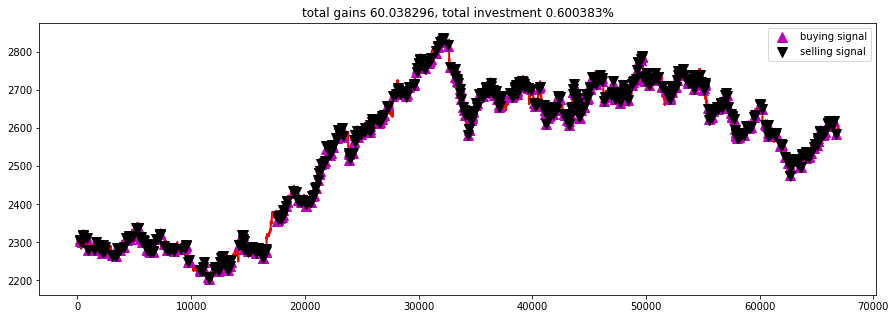

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**ULVR**

In [ ]:
close = df1_ULVR.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -47.987918.3, cost: 0.002281, total money: 9952.012082
epoch: 20, total rewards: -58.681011.3, cost: 0.001560, total money: 9941.318989
epoch: 30, total rewards: -51.978321.3, cost: 0.001590, total money: 9948.021679
epoch: 40, total rewards: -12.094991.3, cost: 0.001063, total money: 9987.905009
epoch: 50, total rewards: 24.408153.3, cost: 0.002154, total money: 10024.408153


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 30: buy 1 unit at price 3802.699715, total balance 6197.300285
mins 34, sell 1 unit at price 3800.708227, investment -0.052370 %, total balance 9998.008512,
mins 402: buy 1 unit at price 3799.497581, total balance 6198.510931
mins 406, sell 1 unit at price 3797.894003, investment -0.042205 %, total balance 9996.404934,
mins 427: buy 1 unit at price 3803.785798, total balance 6192.619136
mins 428, sell 1 unit at price 3804.539710, investment 0.019820 %, total balance 9997.158846,
mins 429: buy 1 unit at price 3804.957681, total balance 6192.201165
mins 430, sell 1 unit at price 3803.597005, investment -0.035761 %, total balance 9995.798170,
mins 439: buy 1 unit at price 3796.377793, total balance 6199.420377
mins 443, sell 1 unit at price 3790.611660, investment -0.151885 %, total balance 9990.032037,
mins 468: buy 1 unit at price 3796.450564, total balance 6193.581473
mins 469, sell 1 unit at price 3798.539077, investment 0.055012 %, total balance 9992.120550,
mins 479: buy 1 unit

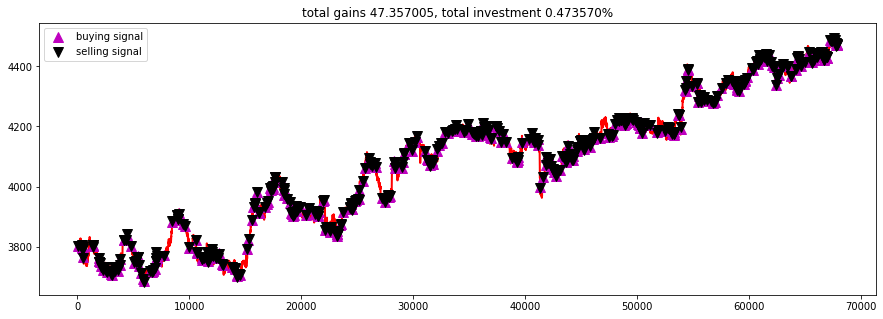

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**HSBC**

In [ ]:
close = df1_HSBC.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 90.055020.3, cost: 0.000272, total money: 10090.055020
epoch: 20, total rewards: 23.538031.3, cost: 0.000215, total money: 10023.538031
epoch: 30, total rewards: 15.784824.3, cost: 0.000178, total money: 10015.784824
epoch: 40, total rewards: 5.224533.3, cost: 0.000152, total money: 10005.224533
epoch: 50, total rewards: 1.308381.3, cost: 0.000133, total money: 10001.308381


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 461: buy 1 unit at price 750.450586, total balance 9249.549414
mins 463, sell 1 unit at price 750.475991, investment 0.003385 %, total balance 10000.025405,
mins 507: buy 1 unit at price 756.748517, total balance 9243.276888
mins 508: buy 1 unit at price 756.771728, total balance 8486.505160
mins 509, sell 1 unit at price 756.712798, investment -0.004720 %, total balance 9243.217958,
mins 510, sell 1 unit at price 756.370933, investment -0.052961 %, total balance 9999.588891,
mins 512: buy 1 unit at price 756.270844, total balance 9243.318046
mins 513: buy 1 unit at price 756.268059, total balance 8487.049987
mins 514: buy 1 unit at price 756.256020, total balance 7730.793967
mins 515: buy 1 unit at price 756.263118, total balance 6974.530850
mins 516, sell 1 unit at price 756.321039, investment 0.006637 %, total balance 7730.851889,
mins 518, sell 1 unit at price 756.183819, investment -0.011139 %, total balance 8487.035708,
mins 519, sell 1 unit at price 756.105718, investment -

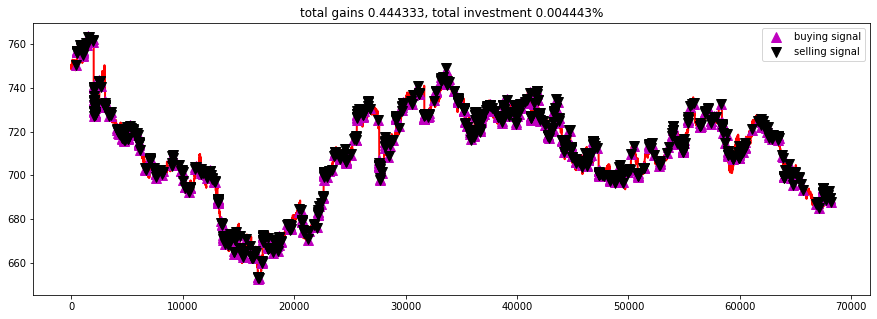

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**BP**

In [ ]:
close = df1_BP.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -3.064593.3, cost: 0.000756, total money: 9996.935407
epoch: 20, total rewards: -35.337852.3, cost: 0.000431, total money: 9964.662148
epoch: 30, total rewards: -36.904302.3, cost: 0.000335, total money: 9963.095698
epoch: 40, total rewards: -34.191375.3, cost: 0.000277, total money: 9965.808625
epoch: 50, total rewards: -22.404486.3, cost: 0.000244, total money: 9977.595514


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 14: buy 1 unit at price 476.237553, total balance 9523.762447
mins 15, sell 1 unit at price 476.101406, investment -0.028588 %, total balance 9999.863854,
mins 27: buy 1 unit at price 474.381297, total balance 9525.482556
mins 29, sell 1 unit at price 474.470144, investment 0.018729 %, total balance 9999.952701,
mins 265: buy 1 unit at price 477.676353, total balance 9522.276347
mins 266, sell 1 unit at price 477.697673, investment 0.004463 %, total balance 9999.974021,
mins 319: buy 1 unit at price 477.801889, total balance 9522.172131
mins 320, sell 1 unit at price 477.828408, investment 0.005550 %, total balance 10000.000539,
mins 340: buy 1 unit at price 473.703167, total balance 9526.297372
mins 341: buy 1 unit at price 473.778833, total balance 9052.518539
mins 345, sell 1 unit at price 474.433895, investment 0.154259 %, total balance 9526.952434,
mins 346, sell 1 unit at price 473.889076, investment 0.023269 %, total balance 10000.841510,
mins 356: buy 1 unit at price 475.5

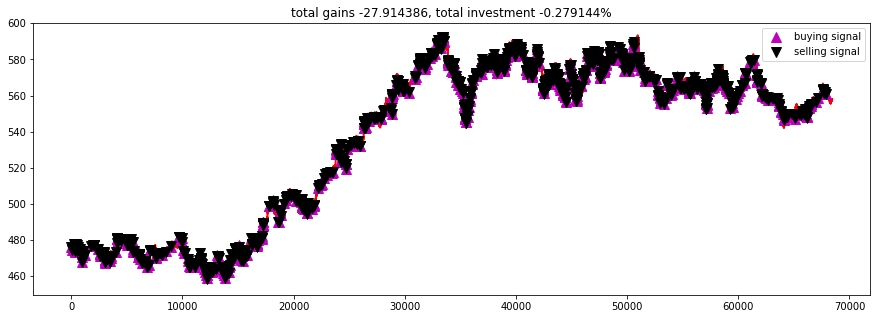

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**GSK**

In [ ]:
close = df1_GSK.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
epoch: 10, total rewards: 250.932126.3, cost: 0.002032, total money: 10250.932126
epoch: 20, total rewards: 233.534444.3, cost: 0.001642, total money: 10233.534444
epoch: 30, total rewards: 163.112631.3, cost: 0.001346, total money: 10163.112631
epoch: 40, total rewards: 94.524775.3, cost: 0.001118, total money: 10094.524775
epoch: 50, total rewards: 55.129936.3, cost: 0.000998, total money: 10055.129936


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 39: buy 1 unit at price 1291.432520, total balance 8708.567480
mins 40, sell 1 unit at price 1291.210840, investment -0.017165 %, total balance 9999.778320,
mins 43: buy 1 unit at price 1290.506574, total balance 8709.271746
mins 44, sell 1 unit at price 1290.768858, investment 0.020324 %, total balance 10000.040604,
mins 97: buy 1 unit at price 1289.231690, total balance 8710.808914
mins 98, sell 1 unit at price 1289.232786, investment 0.000085 %, total balance 10000.041699,
mins 219: buy 1 unit at price 1289.862751, total balance 8710.178948
mins 220, sell 1 unit at price 1290.109806, investment 0.019154 %, total balance 10000.288754,
mins 332: buy 1 unit at price 1280.429303, total balance 8719.859451
mins 333: buy 1 unit at price 1279.765323, total balance 7440.094128
mins 334, sell 1 unit at price 1279.988441, investment -0.034431 %, total balance 8720.082569,
mins 335, sell 1 unit at price 1279.996147, investment 0.018036 %, total balance 10000.078716,
mins 491: buy 1 unit a

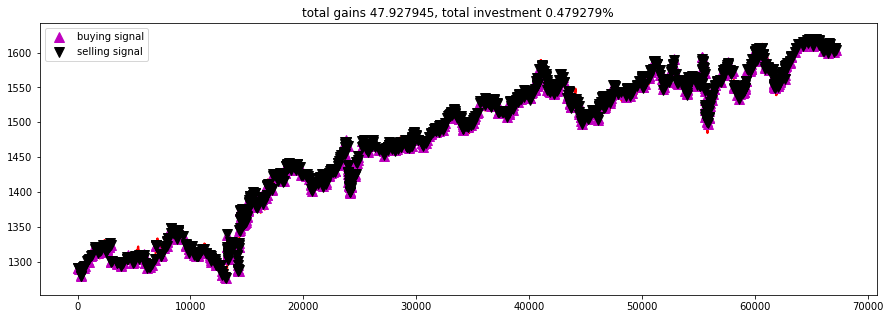

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**LLOY**

In [ ]:
close = df1_LLOY.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: 10.884149.3, cost: 0.000009, total money: 10010.884149
epoch: 20, total rewards: 11.741334.3, cost: 0.000007, total money: 10011.741334
epoch: 30, total rewards: 5.593044.3, cost: 0.000007, total money: 10005.593044
epoch: 40, total rewards: 4.295838.3, cost: 0.000008, total money: 10004.295838
epoch: 50, total rewards: 5.630211.3, cost: 0.000006, total money: 10005.630211


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 18: buy 1 unit at price 66.844417, total balance 9933.155583
mins 19: buy 1 unit at price 66.821472, total balance 9866.334110
mins 20, sell 1 unit at price 66.820491, investment -0.035795 %, total balance 9933.154601,
mins 21, sell 1 unit at price 66.761275, investment -0.090087 %, total balance 9999.915876,
mins 102: buy 1 unit at price 66.492265, total balance 9933.423611
mins 103, sell 1 unit at price 66.500755, investment 0.012769 %, total balance 9999.924366,
mins 245: buy 1 unit at price 66.431068, total balance 9933.493298
mins 247, sell 1 unit at price 66.408267, investment -0.034323 %, total balance 9999.901565,
mins 329: buy 1 unit at price 66.119381, total balance 9933.782183
mins 330: buy 1 unit at price 66.123127, total balance 9867.659056
mins 331, sell 1 unit at price 66.098820, investment -0.031097 %, total balance 9933.757876,
mins 332, sell 1 unit at price 66.047384, investment -0.114548 %, total balance 9999.805261,
mins 346: buy 1 unit at price 65.998500, tota

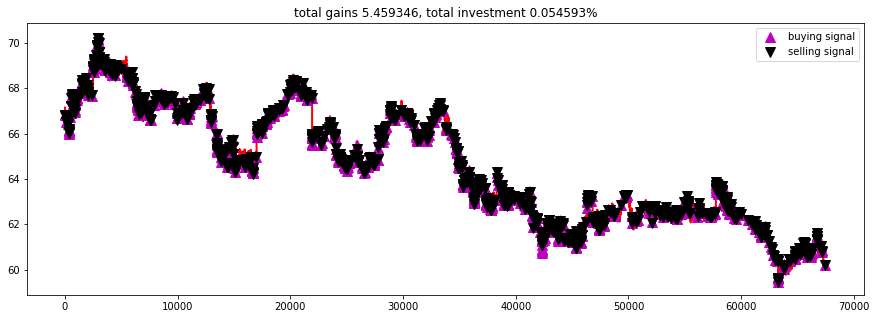

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**AZN**

In [ ]:
close = df1_AZN.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -19.522994.3, cost: 0.007415, total money: 9980.477006
epoch: 20, total rewards: -6.756126.3, cost: 0.004807, total money: 9993.243874
epoch: 30, total rewards: -13.191404.3, cost: 0.022153, total money: 9986.808596
epoch: 40, total rewards: 25.415555.3, cost: 0.006340, total money: 10025.415555
epoch: 50, total rewards: -0.735660.3, cost: 0.002204, total money: 9999.264340


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 123: buy 1 unit at price 4831.165404, total balance 5168.834596
mins 124, sell 1 unit at price 4831.499579, investment 0.006917 %, total balance 10000.334175,
mins 208: buy 1 unit at price 4835.127189, total balance 5165.206986
mins 209, sell 1 unit at price 4840.986841, investment 0.121189 %, total balance 10006.193827,
mins 250: buy 1 unit at price 4833.229890, total balance 5172.963937
mins 251, sell 1 unit at price 4830.909963, investment -0.048000 %, total balance 10003.873900,
mins 257: buy 1 unit at price 4834.213868, total balance 5169.660032
mins 258, sell 1 unit at price 4832.182401, investment -0.042023 %, total balance 10001.842433,
mins 309: buy 1 unit at price 4831.105713, total balance 5170.736719
mins 310, sell 1 unit at price 4831.035238, investment -0.001459 %, total balance 10001.771957,
mins 347: buy 1 unit at price 4804.751852, total balance 5197.020105
mins 348, sell 1 unit at price 4804.806173, investment 0.001131 %, total balance 10001.826278,
mins 748: buy

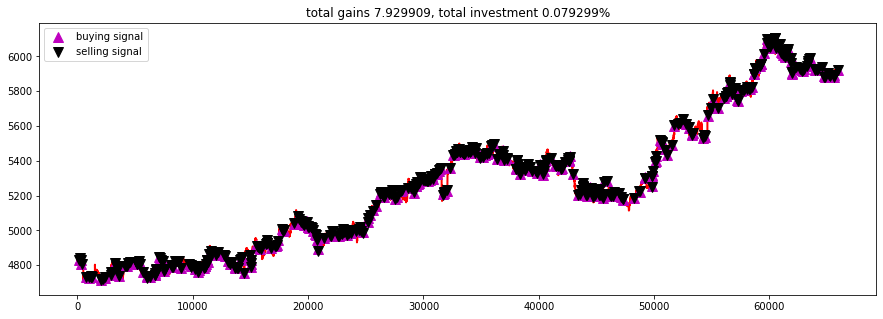

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**TSCO**

In [ ]:
close = df1_TSCO.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -8.622459.3, cost: 0.000461, total money: 9991.377541
epoch: 20, total rewards: -7.776458.3, cost: 0.000452, total money: 9992.223542
epoch: 30, total rewards: 0.939930.3, cost: 0.000476, total money: 10000.939930
epoch: 40, total rewards: 6.875170.3, cost: 0.000379, total money: 10006.875170
epoch: 50, total rewards: 8.526532.3, cost: 0.000407, total money: 10008.526532


In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 38: buy 1 unit at price 203.200007, total balance 9796.799993
mins 43, sell 1 unit at price 203.133745, investment -0.032609 %, total balance 9999.933738,
mins 209: buy 1 unit at price 203.601475, total balance 9796.332263
mins 210, sell 1 unit at price 203.625492, investment 0.011796 %, total balance 9999.957755,
mins 259: buy 1 unit at price 201.199520, total balance 9798.758235
mins 260, sell 1 unit at price 200.966507, investment -0.115812 %, total balance 9999.724742,
mins 276: buy 1 unit at price 201.870378, total balance 9797.854363
mins 277, sell 1 unit at price 201.890126, investment 0.009782 %, total balance 9999.744489,
mins 316: buy 1 unit at price 202.902423, total balance 9796.842067
mins 322, sell 1 unit at price 202.545374, investment -0.175971 %, total balance 9999.387441,
mins 353: buy 1 unit at price 202.880938, total balance 9796.506503
mins 354, sell 1 unit at price 202.968646, investment 0.043231 %, total balance 9999.475149,
mins 425: buy 1 unit at price 202

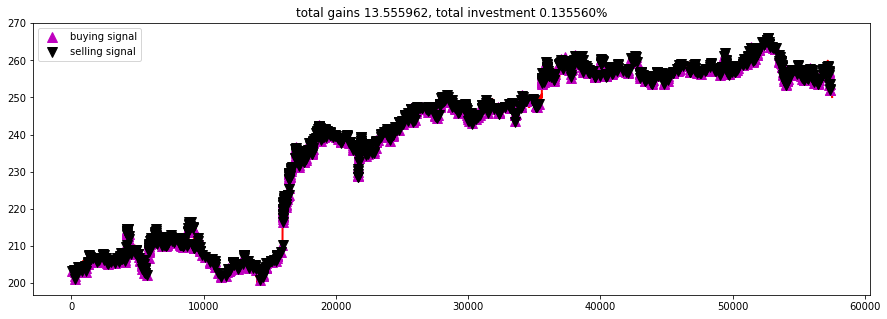

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**AAL**

In [77]:
close = df1_AAL.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -241.639207.3, cost: 0.002542, total money: 9758.360793
epoch: 20, total rewards: -143.769219.3, cost: 0.001784, total money: 9856.230781
epoch: 30, total rewards: -87.364202.3, cost: 0.002710, total money: 9912.635798
epoch: 40, total rewards: -135.443066.3, cost: 0.000906, total money: 9864.556934
epoch: 50, total rewards: -115.225531.3, cost: 0.000759, total money: 9884.774469


In [78]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 11: buy 1 unit at price 1671.526987, total balance 8328.473013
mins 12, sell 1 unit at price 1670.118083, investment -0.084288 %, total balance 9998.591096,
mins 230: buy 1 unit at price 1696.733837, total balance 8301.857259
mins 231, sell 1 unit at price 1696.241163, investment -0.029037 %, total balance 9998.098422,
mins 379: buy 1 unit at price 1667.534641, total balance 8330.563781
mins 382, sell 1 unit at price 1668.296746, investment 0.045702 %, total balance 9998.860527,
mins 458: buy 1 unit at price 1709.553322, total balance 8289.307204
mins 459, sell 1 unit at price 1708.945410, investment -0.035560 %, total balance 9998.252614,
mins 519: buy 1 unit at price 1741.435198, total balance 8256.817416
mins 521, sell 1 unit at price 1742.002765, investment 0.032592 %, total balance 9998.820182,
mins 529: buy 1 unit at price 1742.973640, total balance 8255.846542
mins 530, sell 1 unit at price 1742.293740, investment -0.039008 %, total balance 9998.140281,
mins 555: buy 1 unit

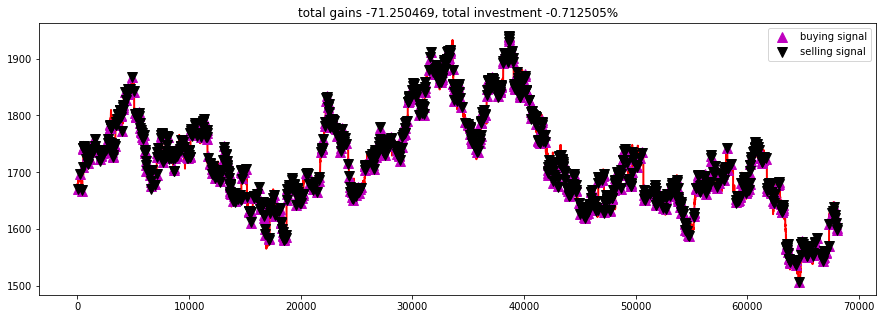

In [79]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

**DGE**

In [80]:
close = df1_DGE.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = QAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip, 
              batch_size = batch_size)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

epoch: 10, total rewards: -46.132463.3, cost: 0.004508, total money: 9953.867537
epoch: 20, total rewards: 19.607911.3, cost: 0.006038, total money: 10019.607911
epoch: 30, total rewards: 19.310213.3, cost: 0.005957, total money: 10019.310213
epoch: 40, total rewards: 4.490522.3, cost: 0.005428, total money: 10004.490522
epoch: 50, total rewards: 0.190977.3, cost: 0.004850, total money: 10000.190977


In [81]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

mins 395: buy 1 unit at price 2480.370669, total balance 7519.629331
mins 397, sell 1 unit at price 2481.300445, investment 0.037485 %, total balance 10000.929776,
mins 407: buy 1 unit at price 2480.195213, total balance 7520.734563
mins 408, sell 1 unit at price 2481.342849, investment 0.046272 %, total balance 10002.077412,
mins 499: buy 1 unit at price 2473.623912, total balance 7528.453500
mins 501, sell 1 unit at price 2472.273027, investment -0.054612 %, total balance 10000.726527,
mins 529: buy 1 unit at price 2468.776496, total balance 7531.950031
mins 530, sell 1 unit at price 2467.981054, investment -0.032220 %, total balance 9999.931085,
mins 883: buy 1 unit at price 2474.248783, total balance 7525.682302
mins 884, sell 1 unit at price 2475.027372, investment 0.031468 %, total balance 10000.709674,
mins 985: buy 1 unit at price 2470.905868, total balance 7529.803806
mins 987, sell 1 unit at price 2471.285837, investment 0.015378 %, total balance 10001.089643,
mins 1049: buy 

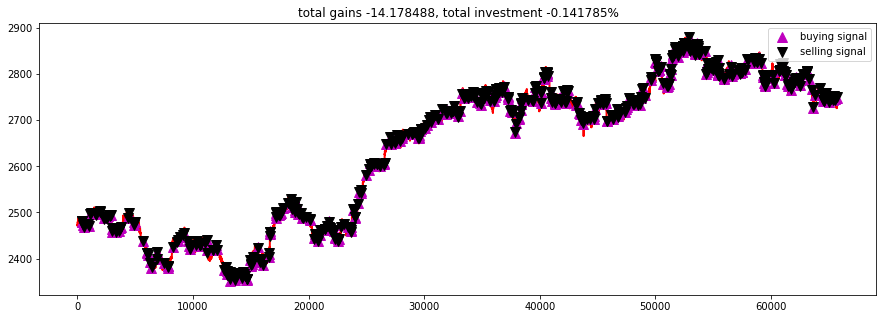

In [82]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()

#DDQN#

In [83]:
from collections import deque
import random

name = 'Double Deep Q-learning agent'


class Model:
    def __init__(self, input_size, output_size, layer_size, learning_rate, name):
        with tf.variable_scope(name):
            self.X = tf.placeholder(tf.float32, (None, None, input_size))
            self.Y = tf.placeholder(tf.float32, (None, output_size))
            cell = tf.nn.rnn_cell.LSTMCell(layer_size, state_is_tuple = False)
            self.hidden_layer = tf.placeholder(tf.float32, (None, 2 * layer_size))
            self.rnn,self.last_state = tf.nn.dynamic_rnn(inputs=self.X,cell=cell,
                                                    dtype=tf.float32,
                                                    initial_state=self.hidden_layer)
            self.logits = tf.layers.dense(self.rnn[:,-1], output_size)
            self.cost = tf.reduce_sum(tf.square(self.Y - self.logits))
            self.optimizer = tf.train.AdamOptimizer(learning_rate = learning_rate).minimize(self.cost)
        
class DDQNAgent:

    LEARNING_RATE = 0.003
    BATCH_SIZE = 32
    LAYER_SIZE = 256
    OUTPUT_SIZE = 3
    EPSILON = 0.5
    DECAY_RATE = 0.005
    MIN_EPSILON = 0.1
    GAMMA = 0.99
    MEMORIES = deque()
    COPY = 1000
    T_COPY = 0
    MEMORY_SIZE = 300
    
    def __init__(self, state_size, window_size, trend, skip):
        self.state_size = state_size
        self.window_size = window_size
        self.half_window = window_size // 2
        self.trend = trend
        self.skip = skip
        tf.reset_default_graph()
        self.INITIAL_FEATURES = np.zeros((4, self.state_size))
        self.model = Model(self.state_size, self.OUTPUT_SIZE, self.LAYER_SIZE, self.LEARNING_RATE,
                           'real_model')
        self.model_negative = Model(self.state_size, self.OUTPUT_SIZE, self.LAYER_SIZE, self.LEARNING_RATE,
                                   'negative_model')
        self.sess = tf.InteractiveSession()
        self.sess.run(tf.global_variables_initializer())
        self.trainable = tf.trainable_variables()
    
    def _assign(self, from_name, to_name):
        from_w = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=from_name)
        to_w = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=to_name)
        for i in range(len(from_w)):
            assign_op = to_w[i].assign(from_w[i])
            self.sess.run(assign_op)

    def _memorize(self, state, action, reward, new_state, dead, rnn_state):
        self.MEMORIES.append((state, action, reward, new_state, dead, rnn_state))
        if len(self.MEMORIES) > self.MEMORY_SIZE:
            self.MEMORIES.popleft()

    def _select_action(self, state):
        if np.random.rand() < self.EPSILON:
            action = np.random.randint(self.OUTPUT_SIZE)
        else:
            action = self.get_predicted_action([state])
        return action

    def _construct_memories(self, replay):
        states = np.array([a[0] for a in replay])
        new_states = np.array([a[3] for a in replay])
        init_values = np.array([a[-1] for a in replay])
        Q = self.sess.run(self.model.logits, feed_dict={self.model.X:states, 
                                                   self.model.hidden_layer:init_values})
        Q_new = self.sess.run(self.model.logits, feed_dict={self.model.X:new_states, 
                                                       self.model.hidden_layer:init_values})
        Q_new_negative = self.sess.run(self.model_negative.logits, 
                                  feed_dict={self.model_negative.X:new_states, 
                                             self.model_negative.hidden_layer:init_values})
        replay_size = len(replay)
        X = np.empty((replay_size, 4, self.state_size))
        Y = np.empty((replay_size, self.OUTPUT_SIZE))
        INIT_VAL = np.empty((replay_size, 2 * self.LAYER_SIZE))
        for i in range(replay_size):
            state_r, action_r, reward_r, new_state_r, dead_r, rnn_memory = replay[i]
            target = Q[i]
            target[action_r] = reward_r
            if not dead_r:
                target[action_r] += self.GAMMA * Q_new_negative[i, np.argmax(Q_new[i])]
            X[i] = state_r
            Y[i] = target
            INIT_VAL[i] = rnn_memory
        return X, Y, INIT_VAL
    
    def get_state(self, t):
        window_size = self.window_size + 1
        d = t - window_size + 1
        block = self.trend[d : t + 1] if d >= 0 else -d * [self.trend[0]] + self.trend[0 : t + 1]
        res = []
        for i in range(window_size - 1):
            res.append(block[i + 1] - block[i])
        return np.array(res)
    
    def buy(self, initial_money):
        starting_money = initial_money
        states_sell = []
        states_buy = []
        inventory = []
        state = self.get_state(0)
        init_value = np.zeros((1, 2 * self.LAYER_SIZE))
        for k in range(self.INITIAL_FEATURES.shape[0]):
            self.INITIAL_FEATURES[k,:] = state
        for t in range(0, len(self.trend) - 1, self.skip):
            action, last_state = self.sess.run([self.model.logits,self.model.last_state],
                                                feed_dict={self.model.X:[self.INITIAL_FEATURES],
                                                            self.model.hidden_layer:init_value})
            action, init_value = np.argmax(action[0]), last_state
            next_state = self.get_state(t + 1)
            
            if action == 1 and initial_money >= self.trend[t]:
                inventory.append(self.trend[t])
                initial_money -= self.trend[t]
                states_buy.append(t)
                print('mins %d: buy 1 unit at price %f, total balance %f'% (t, self.trend[t], initial_money))
            
            elif action == 2 and len(inventory):
                bought_price = inventory.pop(0)
                initial_money += self.trend[t]
                states_sell.append(t)
                try:
                    invest = ((close[t] - bought_price) / bought_price) * 100
                except:
                    invest = 0
                print(
                    'mins %d, sell 1 unit at price %f, investment %f %%, total balance %f,'
                    % (t, close[t], invest, initial_money)
                )
            
            new_state = np.append([self.get_state(t + 1)], self.INITIAL_FEATURES[:3, :], axis = 0)
            self.INITIAL_FEATURES = new_state
        invest = ((initial_money - starting_money) / starting_money) * 100
        total_gains = initial_money - starting_money
        return states_buy, states_sell, total_gains, invest
            
    
    def train(self, iterations, checkpoint, initial_money):
        for i in range(iterations):
            total_profit = 0
            inventory = []
            state = self.get_state(0)
            starting_money = initial_money
            init_value = np.zeros((1, 2 * self.LAYER_SIZE))
            for k in range(self.INITIAL_FEATURES.shape[0]):
                self.INITIAL_FEATURES[k,:] = state
            for t in range(0, len(self.trend) - 1, self.skip):
                if (self.T_COPY + 1) % self.COPY == 0:
                    self._assign('real_model', 'negative_model')
                
                if np.random.rand() < self.EPSILON:
                    action = np.random.randint(self.OUTPUT_SIZE)
                else:
                    action, last_state = self.sess.run([self.model.logits,
                                                  self.model.last_state],
                                                  feed_dict={self.model.X:[self.INITIAL_FEATURES],
                                                             self.model.hidden_layer:init_value})
                    action, init_value = np.argmax(action[0]), last_state
                    
                next_state = self.get_state(t + 1)
                
                if action == 1 and starting_money >= self.trend[t]:
                    inventory.append(self.trend[t])
                    starting_money -= self.trend[t]
                
                elif action == 2 and len(inventory) > 0:
                    bought_price = inventory.pop(0)
                    total_profit += self.trend[t] - bought_price
                    starting_money += self.trend[t]
                    
                invest = ((starting_money - initial_money) / initial_money)
                new_state = np.append([self.get_state(t + 1)], self.INITIAL_FEATURES[:3, :], axis = 0)
                
                self._memorize(self.INITIAL_FEATURES, action, invest, new_state, 
                               starting_money < initial_money, init_value[0])
                self.INITIAL_FEATURES = new_state
                batch_size = min(len(self.MEMORIES), self.BATCH_SIZE)
                replay = random.sample(self.MEMORIES, batch_size)
                X, Y, INIT_VAL = self._construct_memories(replay)
                
                cost, _ = self.sess.run([self.model.cost, self.model.optimizer], 
                                        feed_dict={self.model.X: X, self.model.Y:Y,
                                                  self.model.hidden_layer: INIT_VAL})
                self.T_COPY += 1
                self.EPSILON = self.MIN_EPSILON + (1.0 - self.MIN_EPSILON) * np.exp(-self.DECAY_RATE * i)
            if (i+1) % checkpoint == 0:
                print('epoch: %d, total rewards: %f.3, cost: %f, total money: %f'%(i + 1, total_profit, cost,
                                                                                  starting_money))

**RDSB**

In [84]:
close = df1_RDSB.ema_mean.values.tolist()
initial_money = 10000
window_size = 30
skip = 1
batch_size = 32
agent = DDQNAgent(state_size = window_size, 
              window_size = window_size, 
              trend = close, 
              skip = skip)
agent.train(iterations = 50, checkpoint = 10, initial_money = initial_money)

NameError: ignored

In [ ]:
states_buy, states_sell, total_gains, invest = agent.buy(initial_money = initial_money)

In [ ]:
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.savefig('output/'+name+'.png')
plt.show()

#LSTM-PPO

In [ ]:
https://github.com/q-learning-trader/reinforcement-learning-trading-robot

#Q-Learning 

In [ ]:
https://github.com/q-learning-trader/q-trading-pytorch/blob/master/visualize.ipynb